## IMPORTING LIBRARIES

In [143]:
import gzip
import json
import pandas as pd                                              #importing the pandas library
import numpy as np                                              #importing the numpy library
import seaborn as sns                                            #importing the library for visualisatrion
import matplotlib.pyplot as plt                                  #importing the library for visualisatrion
from tabulate import tabulate                                    #For using the table form to our data
import warnings                                                  #To avoid the shown warnings
warnings.filterwarnings("ignore")
from sklearn import preprocessing                                #For the preprocessing purpose
from sklearn.preprocessing import MinMaxScaler,StandardScaler    #for scaling the data
from sklearn.preprocessing import LabelEncoder                   # for converting the object columns to numerical one
from sklearn.preprocessing import StandardScaler                 #for scaling all the features on same scale
from sklearn.cluster import KMeans                               #for making the clusters
from sklearn.neighbors import NearestNeighbors                   #for selecting the clusters
from sklearn.metrics import silhouette_score                     #for checking the accuracy
import scipy.cluster.hierarchy as sch                            #for making the hirerchical graph to selecting the cluster
from sklearn.cluster import AgglomerativeClustering              #for making the hirerchical model
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import Binarizer
from sklearn.preprocessing import MultiLabelBinarizer

from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

from sklearn.metrics import f1_score


from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import confusion_matrix, classification_report  
import textblob
from textblob import TextBlob
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import BernoulliNB 
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier

import spacy                                                  # Import spaCy library

from nltk.corpus import stopwords
stop_words_nltk = stopwords.words('english')                           # Load model
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import plot_confusion_matrix
import imblearn
print(imblearn.__version__)
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from matplotlib import pyplot
from numpy import where

0.10.1


## Importing Data

## METADATA

In [2]:
path_meta=("C:\\Users\\mearv\\OneDrive\\Desktop\\MEGA PROJECT DATASETS\\METADATA\\DIGITAL MUSIC AND INSTRUMENTS\\meta_Musical_Instruments.json\\meta_Musical_Instruments.json")

In [3]:
json_meta=[json.loads(line) for line in open(path_meta,'r')]       #Reading the Json file

In [4]:
df_meta=pd.DataFrame(json_meta)                                    #Converting it into Dataframe to work with

In [5]:
df_meta.head(2)

,category,tech1,description,fit,title,also_buy,tech2,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,imageURL,imageURLHighRes,details
0,"[Musical Instruments, Drums & Percussion, Hand...",,[Cricket Rubbing the spine with the wooden sti...,,Wooden Percussion 2 Piece Set of 3 Inch Cricke...,"[B00NP8GYVS, B00NP80XMO, B00NP8M098]",,WADSUWAN SHOP,"[Wood percussion, Owl whistle*, Includes woode...","[>#141,729 in Musical Instruments (See Top 100...",[],Musical Instruments,,"December 2, 2013",,0000989983,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,NaN
1,"[Musical Instruments, Drums & Percussion, Hand...",,[Frog - Rubbing its spine with the wooden stic...,,"Wooden Percussion 3 Piece Set Frog, Cricket an...","[B00NP8GYVS, B00NP80XMO, B01MY48HK5, B00AZZ1AJ...",,WADSUWAN SHOP,"[Wood percussion, Small 3 inches, Creates orig...","[>#1,622 in Musical Instruments (See Top 100 i...",[],Musical Instruments,,"December 2, 2013",$0.91,0000098906,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,NaN


In [6]:
df_meta.shape

(120310, 19)

In [7]:
df_meta.main_cat.value_counts()

Musical Instruments                                                                                                                                                           113468
Home Audio & Theater                                                                                                                                                            1300
All Electronics                                                                                                                                                                  842
Software                                                                                                                                                                         770
                                                                                                                                                                                 642
Amazon Home                                                                                    

In [8]:
df_meta=df_meta[df_meta['main_cat']=='Musical Instruments']

In [9]:
df_meta.shape

(113468, 19)

## 5 CORE DATA

In [10]:
path_5core="C:\\Users\\mearv\\OneDrive\\Desktop\\MEGA PROJECT DATASETS\\5-CORE\\DIGITAL MUSIC AND INSTRUMENTS\\Musical_Instruments_5.json\\Musical_Instruments_5.json"

In [11]:
json_5core=[json.loads(line) for line in open(path_5core,'r')]       #Reading the Json file

In [12]:
df_core=pd.DataFrame(json_5core)                                    #Converting it into Dataframe to work with

In [13]:
df_core.head(2)

,overall,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,vote,style,image
0,5.0,True,"10 30, 2016",A3FO5AKVTFRCRJ,0739079891,francisco,It's good for beginners,Five Stars,1477785600,NaN,NaN,NaN
1,5.0,True,"06 30, 2016",A3UCGC1DHFMBCE,0739079891,Eb Jack Murray,I recommend this starter Ukulele kit. I has e...,Five Stars,1467244800,NaN,NaN,NaN


In [14]:
df_core.shape

(231392, 12)

In [678]:
df_core.reviewText.nunique()

188725

In [681]:
df_core.asin.nunique()

10620

## Reviews Data

In [15]:
import os

In [16]:
os.getcwd()

'C:\\Users\\mearv\\OneDrive\\Desktop'

In [17]:
path_reviews="C:\\Users\\mearv\\OneDrive\\Desktop\\Musical_Instruments.json"

In [18]:
json_reviews=[json.loads(line) for line in open(path_reviews,'r')]       #Reading the Json file

In [19]:
df_reviews=pd.DataFrame(json_reviews)                                    #Converting it into Dataframe to work with

In [20]:
df_reviews.head(2)

,overall,vote,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime,image
0,5.0,90,False,"08 9, 2004",AXHY24HWOF184,0470536454,{'Format:': ' Paperback'},Bendy,Crocheting for Dummies by Karen Manthey & Susa...,Terrific Book for Learning the Art of Crochet,1092009600,NaN
1,4.0,2,True,"04 6, 2017",A29OWR79AM796H,0470536454,{'Format:': ' Hardcover'},Amazon Customer,Very helpful...,Four Stars,1491436800,NaN


In [21]:
df_reviews.shape

(1512530, 12)

### Since we have reviewername in our 5core data already, there is no need for reviews data

### Now,let's merge the data on asin(product ID)

In [22]:
df_meta.head(2)

,category,tech1,description,fit,title,also_buy,tech2,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,imageURL,imageURLHighRes,details
0,"[Musical Instruments, Drums & Percussion, Hand...",,[Cricket Rubbing the spine with the wooden sti...,,Wooden Percussion 2 Piece Set of 3 Inch Cricke...,"[B00NP8GYVS, B00NP80XMO, B00NP8M098]",,WADSUWAN SHOP,"[Wood percussion, Owl whistle*, Includes woode...","[>#141,729 in Musical Instruments (See Top 100...",[],Musical Instruments,,"December 2, 2013",,0000989983,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,NaN
1,"[Musical Instruments, Drums & Percussion, Hand...",,[Frog - Rubbing its spine with the wooden stic...,,"Wooden Percussion 3 Piece Set Frog, Cricket an...","[B00NP8GYVS, B00NP80XMO, B01MY48HK5, B00AZZ1AJ...",,WADSUWAN SHOP,"[Wood percussion, Small 3 inches, Creates orig...","[>#1,622 in Musical Instruments (See Top 100 i...",[],Musical Instruments,,"December 2, 2013",$0.91,0000098906,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,NaN


In [23]:
df_core.head(2)

,overall,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,vote,style,image
0,5.0,True,"10 30, 2016",A3FO5AKVTFRCRJ,0739079891,francisco,It's good for beginners,Five Stars,1477785600,NaN,NaN,NaN
1,5.0,True,"06 30, 2016",A3UCGC1DHFMBCE,0739079891,Eb Jack Murray,I recommend this starter Ukulele kit. I has e...,Five Stars,1467244800,NaN,NaN,NaN


In [24]:
df_meta.asin.nunique()

105776

In [25]:
df_core.asin.nunique()

10620

In [28]:
to_merge.rename(columns={'asin':'product_id'},inplace=True)

In [27]:
to_merge=df_meta[['brand','title','asin','price']]

In [29]:
to_merge.columns

Index(['brand', 'title', 'product_id', 'price'], dtype='object')

In [30]:
df_merge=pd.merge(df_core,to_merge,left_on='asin',right_on='product_id',how='inner')

In [31]:
df_merge.shape

(279867, 16)

In [32]:
df_merge.head(2)

,overall,verified,reviewTime,reviewerID,asin,reviewerName,reviewText,summary,unixReviewTime,vote,style,image,brand,title,product_id,price
0,5.0,True,"10 30, 2016",A3FO5AKVTFRCRJ,0739079891,francisco,It's good for beginners,Five Stars,1477785600,NaN,NaN,NaN,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,
1,5.0,True,"06 30, 2016",A3UCGC1DHFMBCE,0739079891,Eb Jack Murray,I recommend this starter Ukulele kit. I has e...,Five Stars,1467244800,NaN,NaN,NaN,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,


In [33]:
df_merge.drop(columns=['vote','style','image','asin','unixReviewTime'],inplace=True)

In [34]:
df_merge.shape

(279867, 11)

In [35]:
df_merge.isnull().sum()

overall          0
verified         0
reviewTime       0
reviewerID       0
reviewerName    34
reviewText      66
summary         62
brand            0
title            0
product_id       0
price            0
dtype: int64

#### We are dropping values as it is very less when compared to the whole shape

In [36]:
df_merge.dropna(inplace=True)

In [37]:
df_merge.shape

(279706, 11)

In [38]:
df_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 279706 entries, 0 to 279866
Data columns (total 11 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   overall       279706 non-null  float64
 1   verified      279706 non-null  bool   
 2   reviewTime    279706 non-null  object 
 3   reviewerID    279706 non-null  object 
 4   reviewerName  279706 non-null  object 
 5   reviewText    279706 non-null  object 
 6   summary       279706 non-null  object 
 7   brand         279706 non-null  object 
 8   title         279706 non-null  object 
 9   product_id    279706 non-null  object 
 10  price         279706 non-null  object 
dtypes: bool(1), float64(1), object(9)
memory usage: 23.7+ MB


## Dropping Duplicates

In [39]:
df_merge.duplicated('product_id').sum()

269405

In [40]:
df_merge.duplicated(['product_id','reviewText','reviewerName','reviewerID']).sum()

63400

In [41]:
df_merge = df_merge.drop_duplicates(subset=['product_id','reviewText','reviewerName','reviewerID'], keep='first')
df_merge.shape

(216306, 11)

### Check for Special Characters in our columns

In [42]:
for i in df_merge.columns:
    print(i,'\n\n',df_merge[i].value_counts())
    print('_'*150)

overall 

 5.0    151445
4.0     36250
3.0     14956
1.0      6871
2.0      6784
Name: overall, dtype: int64
______________________________________________________________________________________________________________________________________________________
verified 

 True     193785
False     22521
Name: verified, dtype: int64
______________________________________________________________________________________________________________________________________________________
reviewTime 

 03 2, 2016     318
03 1, 2016     269
12 1, 2014     243
04 25, 2016    229
12 2, 2016     226
              ... 
03 8, 2009       1
12 18, 2006      1
03 11, 2009      1
09 5, 2009       1
08 31, 2018      1
Name: reviewTime, Length: 3933, dtype: int64
______________________________________________________________________________________________________________________________________________________
reviewerID 

 A2NYK9KWFMJV4Y    252
A3YVD62FSVIUJ     159
A396ELNTQDFYPO    158
ADH0O8UVJOT10    

## Let's create a copy of our final data first

In [43]:
df_final=df_merge.copy()

In [44]:
df_final['price']=df_final['price'].str.replace('$','')

In [45]:
pd.set_option('display.max_rows',None)

In [46]:
df_final.price.value_counts()

In [47]:
df_final['price'].replace({'.a-box-inner{background-color:#fff}#alohaBuyBoxWidget .selected{background-color:#fffbf3;border-color:#e77600;box-shadow:0 0 3px rgba(228,121,17,.5)}#alohaBuyBoxWidget .contract-not-available{color:gray}#aloha-cart-popover .aloha-cart{height:auto;overflow:hidden}#aloha-cart-popover #aloha-cartInfo{float:left}#aloha-cart-popover #aloha-cart-details{float:right;margin-top:1em}#aloha-cart-popover .deviceContainer{width:160px;float:left;padding-right:10px;border-right:1px solid #ddd}#aloha-cart-popover li:last-child{border-right:0}#aloha-cart-popover .aloha-device-title{height:3em;overflow:hidden}#aloha-cart-popover .aloha-thumbnail-container{height:100px;margin-bottom:1em;text-align:center}#aloha-cart-popover .aloha-price-container{text-align:center}#aloha-cart-popover .aloha-thumbnail-container img{height:inherit}#aloha-cart-popover .aloha-cart{border-top:1px solid #ddd;border-bottom:1px solid #ddd}#aloha-cart-popover #aloha-cart-info{margin-right:0}#alohaBuyBoxWidget .without-contract-subheading{margin-right:0}#aloha-bb-help-nodes .aloha-bb-contract-term-heading{color:gray;font-family:arial;margin-top:.5em;text-align:center;height:.7em;border-bottom:1px solid gray;margin-bottom:1.6em}#aloha-bb-help-nodes .aloha-bb-contract-term-heading span{background-color:#fff;padding:0 10px 0 10px}#alohaAvailabilityUS_feature_div .availability a{text-decoration:none}#alohaPricingWidget a{text-decoration:none}#alohaAvailabilityUS_feature_div .availability{margin-top:-4px;margin-bottom:0}#alohaBuyBoxWidget .select-transaction-alert .a-icon-alert{top:18px;left:3px}#alohaBuyBoxWidget .select-transaction-alert .a-alert-container{padding-left:39px;width:290px}#alohaBuyBoxUS_feature_div #alohaBuyBoxWidget .contract-container .contract-term-heading a{text-decoration:none}#alohaBuyBoxUS_feature_div #alohaBuyBoxWidget .annual-contract-box .a-icon-popover{display:none}#alohaBuyBoxUS_feature_div #alohaBuyBoxWidget .contract-container .annual-contract-box{cursor:pointer;cursor:hand}#alohaBuyBoxUS_feature_div #alohaBuyBoxWidget .aloha-buybox-price{font-size:15px}#alohaBuyBoxUS_feature_div #alohaBuyBoxWidget #linkOffSection a{text-decoration:none}#alohaBuyBoxUS_feature_div .lockedUsedBuyboxContainer{padding-left:3.5%}#alohaBuyBoxUS_feature_div .alohaBuyboxUtilsNoWrap{white-space:nowrap}.hidden{display:none}.simo-no-padding{padding:0}.carrier-reviews-cell{padding-left:10px}.carrier-reviews-bordered-cell{border:1px dotted #ccc}.carrier-reviews-selected-cell{background-color:#ffd}#aloha-carrier-compatibility-modal-table-description{margin-top:10px;margin-bottom:14px}.aloha-carrier-compatibility-sortable-header.carrier{min-width:97px}.aloha-carrier-compatibility-sortable-header.compatibility{min-width:156px}.aloha-carrier-compatibility-sortable-header div{float:left}.aloha-carrier-compatibility-sortable-header i.a-icon{margin-left:10px;margin-top:4px}#aloha-carrier-compatibility-overview-table.a-bordered.a-vertical-stripes td:nth-child(2n),#aloha-carrier-compatibility-overview-table.a-bordered.a-vertical-stripes th:nth-child(2n){background-color:initial}#aloha-carrier-compatibility-modal-table.a-bordered.a-vertical-stripes td:nth-child(2n),#aloha-carrier-compatibility-modal-table.a-bordered.a-vertical-stripes th:nth-child(2n){background-color:initial}#aloha-carrier-compatibility-table.a-bordered.a-vertical-stripes th:nth-child(2n),.aloha-carrier-compatibility-table.a-bordered.a-vertical-stripes td:nth-child(2n){background-color:transparent}.aloha-carrier-compatibility-column-gray{background-color:#f6f6f6}.aloha-carrier-compatibility-modal-table-row .aloha-carrier-compatibility-tech-text,.aloha-carrier-compatibility-modal-table-row .carrier-name,.aloha-carrier-compatibility-modal-table-row .carrier-rating-summary{min-height:27px;display:inline-block;cursor:default}.aloha-carrier-compatibility-modal-table-row .aloha-carrier-compatibility-tech-text:first-line,.aloha-carrier-compatibility-modal-table-row .carrier-name:first-line,.aloha-carrier-compatibility-modal-table-row .carrier-rating-summary:first-line{line-height:27px}.aloha-carrier-compatibility-modal-table-row .aloha-carrier-compatibility-icon{margin-top:6px}.aloha-carrier-compatibility-check-icon{width:30px;height:27px;background-position:-318px -35px;background-image:url(https://images-na.ssl-images-amazon.com/images/G/01/AUIClients/AmazonUIBaseCSS-sprite_2x-8e7ef370dc28a214b3f490c9620f4ac501d5a864._V2_.png);background-repeat:no-repeat;background-size:400px 650px;display:inline-block;vertical-align:top}.aloha-carrier-compatibility-hidden{display:none}.aloha-buybox-spaced-link{margin-top:12px;margin-bottom:7px;text-align:center}.popover-tab'
                                  :np.nan},inplace=True)

In [48]:
df_final.price.value_counts()

                  29065
0.91              13620
7.99              10510
14.99              8338
1.96               6992
4.99               3638
22.99              3402
5.99               3308
17.84              3278
9.99               2763
6.99               2719
34.99              2719
4.00               2689
6.04               2649
2.99               2412
12.55              2338
26.24              2091
4.49               2029
19.95              1970
9.95               1921
8.99               1917
10.99              1626
45.14              1588
10.82              1484
12.99              1456
3.89               1416
19.99              1394
11.99              1381
139.99             1238
15.99              1236
24.99              1230
7.43               1152
29.99              1112
12.20              1017
55.09              1008
12.95              1005
39.99               947
8.95                931
11.95               910
8.65                902
13.45               865
7.95            

In [49]:
14.48 - 798.52

-784.04

In [50]:
df_final['price']=df_final['price'].astype(str)

In [51]:
df_final['price'].replace({'14.48 - 798.52':'14.48'},inplace=True)

In [52]:
df_final.price.value_counts()

                 29065
0.91             13620
7.99             10510
14.99             8338
1.96              6992
4.99              3638
22.99             3402
5.99              3308
17.84             3278
9.99              2763
34.99             2719
6.99              2719
4.00              2689
6.04              2649
2.99              2412
12.55             2338
26.24             2091
4.49              2029
19.95             1970
9.95              1921
8.99              1917
nan               1897
10.99             1626
45.14             1588
10.82             1484
12.99             1456
3.89              1416
19.99             1394
11.99             1381
139.99            1238
15.99             1236
24.99             1230
7.43              1152
29.99             1112
12.20             1017
55.09             1008
12.95             1005
39.99              947
8.95               931
11.95              910
8.65               902
13.45              865
7.95               821
62.99      

In [53]:
df_final['price'].replace({'\n\n\n<script':np.nan},inplace=True)

In [54]:
df_final.price.value_counts()

          29065
0.91      13620
7.99      10510
14.99      8338
1.96       6992
4.99       3638
22.99      3402
5.99       3308
17.84      3278
9.99       2763
6.99       2719
34.99      2719
4.00       2689
6.04       2649
2.99       2412
12.55      2338
26.24      2091
4.49       2029
19.95      1970
9.95       1921
8.99       1917
nan        1897
10.99      1626
45.14      1588
10.82      1484
12.99      1456
3.89       1416
19.99      1394
11.99      1381
139.99     1238
15.99      1236
24.99      1230
7.43       1152
29.99      1112
12.20      1017
55.09      1008
12.95      1005
39.99       947
8.95        931
11.95       910
8.65        902
13.45       865
7.95        821
62.99       761
73.49       760
3.98        690
24.95       677
63.97       672
5.95        645
6.95        633
15.65       633
13.99       630
2.95        621
3.70        602
17.99       596
14.95       588
8.92        567
37.99       561
6.94        556
104.99      544
63.98       529
55.08       509
94.49   

In [55]:
df_final['price'].replace({'':0},inplace=True)

In [56]:
df_final['price']=df_final['price'].astype(float)

In [57]:
df_final['price'].mean()

18.53982002746889

In [58]:
df_final['price'].replace({0.00000:df_final['price'].mean()},inplace=True)

In [59]:
df_final.price.value_counts()

18.53982     29065
0.91000      13620
7.99000      10510
14.99000      8338
1.96000       6992
4.99000       3638
22.99000      3402
5.99000       3308
17.84000      3278
9.99000       2763
6.99000       2719
34.99000      2719
4.00000       2689
6.04000       2649
2.99000       2412
12.55000      2338
26.24000      2091
4.49000       2029
19.95000      1970
9.95000       1921
8.99000       1917
10.99000      1626
45.14000      1588
10.82000      1484
12.99000      1456
3.89000       1416
19.99000      1394
11.99000      1381
139.99000     1238
15.99000      1236
24.99000      1230
7.43000       1152
29.99000      1112
12.20000      1017
55.09000      1008
12.95000      1005
39.99000       947
8.95000        931
11.95000       910
8.65000        902
13.45000       865
7.95000        821
62.99000       761
73.49000       760
3.98000        690
24.95000       677
63.97000       672
5.95000        645
6.95000        633
15.65000       633
13.99000       630
2.95000        621
3.70000     

In [75]:
df_final['price'].fillna(0,inplace=True)

### We have cleaned price column

In [76]:
df_final.isnull().sum()

ratings         0
verified        0
reviewTime      0
reviewerID      0
reviewerName    0
brand           0
title           0
product_id      0
price           0
month           0
year            0
reviews         0
dtype: int64

In [61]:
df_final.reviewerID.nunique()

27523

In [62]:
df_final.product_id.nunique()

10301

In [63]:
for i in df_final.columns:
    print(i,':',df_final[i].nunique())

overall : 5
verified : 2
reviewTime : 3933
reviewerID : 27523
reviewerName : 23663
reviewText : 184035
summary : 124421
brand : 1635
title : 10271
product_id : 10301
price : 1747


### Conveting to datetime 

In [64]:
df_final['reviewTime']=pd.to_datetime(df_final['reviewTime'])

In [65]:
df_final['month']=df_final['reviewTime'].dt.month
df_final['year']=df_final['reviewTime'].dt.year

In [66]:
df_final.shape

(216306, 13)

### Concatenating summary and reviewtet as reviews

In [67]:
df_final['reviews']=df_final['summary']+ ' ' + df_final['reviewText']

In [68]:
df_final.drop(columns=['summary','reviewText'],inplace=True)

In [69]:
df_final.rename(columns={'overall':'ratings'},inplace=True)

In [70]:
df_final.shape

(216306, 12)

### Avergae ratings of overall produyctrs in musicl instruments

In [71]:
df_final.ratings.mean()

4.4729780958457

## TEXT PREPROCESSING

In [81]:
import re,string

In [82]:
def data_cleaning(t):       
    t = str(t).lower()
    t = re.sub('\[.*?\]', '', t)
    t = re.sub('https?://\S+|www\.\S+', '', t)
    t = re.sub('<.*?>+', '', t)
    t = re.sub('[%s]' % re.escape(string.punctuation), '', t)
    t = re.sub('\n', '', t)
    t = re.sub('\w*\d\w*', '', t)
    return t
df_final['cleaned_reviews']=df_final['reviews'].apply(data_cleaning)

In [83]:
df_final.head(3)

,ratings,verified,reviewTime,reviewerID,reviewerName,brand,title,product_id,price,month,year,reviews,cleaned_reviews
0,5.0,True,2016-10-30,A3FO5AKVTFRCRJ,francisco,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,10,2016,Five Stars It's good for beginners,five stars its good for beginners
1,5.0,True,2016-06-30,A3UCGC1DHFMBCE,Eb Jack Murray,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,6,2016,Five Stars I recommend this starter Ukulele ki...,five stars i recommend this starter ukulele ki...
2,5.0,True,2016-05-09,A2S9SLRYLPGYZB,Clara LaMarr,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,5,2016,Learning new songs to play regularly G'daughte...,learning new songs to play regularly gdaughter...


## Removing Stoprwords

In [84]:
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
spacy_stopwords=spacy.lang.en.stop_words.STOP_WORDS

In [85]:
spacy_stopwords

{"'d",
 "'ll",
 "'m",
 "'re",
 "'s",
 "'ve",
 'a',
 'about',
 'above',
 'across',
 'after',
 'afterwards',
 'again',
 'against',
 'all',
 'almost',
 'alone',
 'along',
 'already',
 'also',
 'although',
 'always',
 'am',
 'among',
 'amongst',
 'amount',
 'an',
 'and',
 'another',
 'any',
 'anyhow',
 'anyone',
 'anything',
 'anyway',
 'anywhere',
 'are',
 'around',
 'as',
 'at',
 'back',
 'be',
 'became',
 'because',
 'become',
 'becomes',
 'becoming',
 'been',
 'before',
 'beforehand',
 'behind',
 'being',
 'below',
 'beside',
 'besides',
 'between',
 'beyond',
 'both',
 'bottom',
 'but',
 'by',
 'ca',
 'call',
 'can',
 'cannot',
 'could',
 'did',
 'do',
 'does',
 'doing',
 'done',
 'down',
 'due',
 'during',
 'each',
 'eight',
 'either',
 'eleven',
 'else',
 'elsewhere',
 'empty',
 'enough',
 'even',
 'ever',
 'every',
 'everyone',
 'everything',
 'everywhere',
 'except',
 'few',
 'fifteen',
 'fifty',
 'first',
 'five',
 'for',
 'former',
 'formerly',
 'forty',
 'four',
 'from',
 'fron

### Removing particular words which can detremine customer feedback

In [86]:
spacy_stopwords=spacy_stopwords-{"not",'still','nothing',"n't",'empty','enough','cannot', 'could','good','except','bad','five','star','pretty','better','poor','must','most','does', 'although'}

In [87]:
df_final['cleaned_reviews']=df_final['cleaned_reviews'].apply(lambda x: ' '.join([i for i in x.split() if i not in spacy_stopwords]))

In [88]:
df_final.head(3)

,ratings,verified,reviewTime,reviewerID,reviewerName,brand,title,product_id,price,month,year,reviews,cleaned_reviews
0,5.0,True,2016-10-30,A3FO5AKVTFRCRJ,francisco,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,10,2016,Five Stars It's good for beginners,five stars good beginners
1,5.0,True,2016-06-30,A3UCGC1DHFMBCE,Eb Jack Murray,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,6,2016,Five Stars I recommend this starter Ukulele ki...,five stars recommend starter ukulele kit youne...
2,5.0,True,2016-05-09,A2S9SLRYLPGYZB,Clara LaMarr,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,5,2016,Learning new songs to play regularly G'daughte...,learning new songs play regularly gdaughter re...


### Creating a copy of our cleaned data

### TOKENIZATION 

In [92]:
import nltk
nltk.download('punkt')
from nltk import sent_tokenize,word_tokenize

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\mearv\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [93]:
# Function for creating a column token
def token (text):
    token = [w for w in nltk.word_tokenize(str(text))]
    return token

# To create token feature
df_final['token_nltk'] = df_final['cleaned_reviews'].apply(token)

In [94]:
df_final.head(3)

,ratings,verified,reviewTime,reviewerID,reviewerName,brand,title,product_id,price,month,year,reviews,cleaned_reviews,token_nltk
0,5.0,True,2016-10-30,A3FO5AKVTFRCRJ,francisco,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,10,2016,Five Stars It's good for beginners,five stars good beginners,"[five, stars, good, beginners]"
1,5.0,True,2016-06-30,A3UCGC1DHFMBCE,Eb Jack Murray,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,6,2016,Five Stars I recommend this starter Ukulele ki...,five stars recommend starter ukulele kit youne...,"[five, stars, recommend, starter, ukulele, kit..."
2,5.0,True,2016-05-09,A2S9SLRYLPGYZB,Clara LaMarr,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,5,2016,Learning new songs to play regularly G'daughte...,learning new songs play regularly gdaughter re...,"[learning, new, songs, play, regularly, gdaugh..."


## STEMMING

In [98]:
import nltk
from nltk.stem.snowball import SnowballStemmer
stemmer= SnowballStemmer(language='english')

In [100]:
def stem_text(text):
    # Split the text into individual words
    words = text.split()
    
    #Stemming each word from cleaned text
    words=[stemmer.stem(word) for word in words]
    
    # Join the words back into a single string
    return " ".join(words)


# Clean the "text" column using the clean_text() function
df_final["stem_reviews"] = df_final["cleaned_reviews"].apply(stem_text)

# Print the cleaned data
print("\nFiltered Table After adding Stemming column:")
df_final.head(2)



Filtered Table After adding Stemming column:


,ratings,verified,reviewTime,reviewerID,reviewerName,brand,title,product_id,price,month,year,reviews,cleaned_reviews,token_nltk,stem_reviews
0,5.0,True,2016-10-30,A3FO5AKVTFRCRJ,francisco,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,10,2016,Five Stars It's good for beginners,five stars good beginners,"[five, stars, good, beginners]",five star good beginn
1,5.0,True,2016-06-30,A3UCGC1DHFMBCE,Eb Jack Murray,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,6,2016,Five Stars I recommend this starter Ukulele ki...,five stars recommend starter ukulele kit youne...,"[five, stars, recommend, starter, ukulele, kit...",five star recommend starter ukulel kit youne l...


### POLARITY BY TEXTBLOB  REVIEWS

In [103]:
def getPolarity(text):
  return TextBlob(text).sentiment.polarity
df_final['polarity'] = df_final['cleaned_reviews'].apply(getPolarity)

In [119]:
#Modular coding to define our sentiment column
def sent(score):
    if score< -0.1:
        return 'negative'
    elif score > 0.1:
        return 'positive'
    else:
        return 'neutral'

In [120]:
df_final['textblob_sentiment']=df_final['polarity'].apply(sent)

In [121]:
df_final.textblob_sentiment.value_counts()

positive    175047
neutral      34012
negative      7247
Name: textblob_sentiment, dtype: int64

In [111]:
df_final.drop(columns='sentiment',inplace=True)

## CLASSIFIATION

In [122]:
test=df_final[['reviews','cleaned_reviews','textblob_sentiment']]

In [123]:
test.head()

,reviews,cleaned_reviews,textblob_sentiment
0,Five Stars It's good for beginners,five stars good beginners,positive
1,Five Stars I recommend this starter Ukulele ki...,five stars recommend starter ukulele kit youne...,neutral
2,Learning new songs to play regularly G'daughte...,learning new songs play regularly gdaughter re...,neutral
3,A bargain-bin good-enough ukulele that's held ...,bargainbin goodenough ukulele thats held years...,positive
4,Poor Quality product. Please pay attention bet...,poor quality product pay attention better revi...,positive


In [ ]:
from sklearn.preprocessing import LabelEncoder
label=LabelEncoder()

In [ ]:
test['textblob_sentiment']=label.fit_transform(test['textblob_sentiment'])    #sentiment column get label encoded for future predicts
test

In [128]:
test.head()

,reviews,cleaned_reviews,textblob_sentiment
0,Five Stars It's good for beginners,five stars good beginners,2
1,Five Stars I recommend this starter Ukulele ki...,five stars recommend starter ukulele kit youne...,1
2,Learning new songs to play regularly G'daughte...,learning new songs play regularly gdaughter re...,1
3,A bargain-bin good-enough ukulele that's held ...,bargainbin goodenough ukulele thats held years...,2
4,Poor Quality product. Please pay attention bet...,poor quality product pay attention better revi...,2


In [129]:
pd.set_option('display.max_rows',5)

### DATA SPLITTING

In [130]:
X=test['reviews']               
y=test['textblob_sentiment']
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=20)  #splitting data into 30:70 ratio 

In [131]:
print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)

(151414,) (64892,) (151414,) (64892,)


### Defining a Funct For easy Prediction

In [137]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\mearv\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [140]:
from nltk.corpus import stopwords
stop_words_nltk = stopwords.words('english') 

In [141]:
def funct(classifier,input_train,input_test,label_train,label_test):
    vectorizer=TfidfVectorizer(sublinear_tf=True,max_df=0.5,min_df=1,stop_words=stopwords.words('english'),use_idf=True,smooth_idf=True)
    X_train=vectorizer.fit_transform(input_train)         #vecrorizing our data
    X_test=vectorizer.transform(input_test)
    clf=classifier.fit(X_train,label_train)              # putting the ml model
    y_pred=clf.predict(X_test)                          # prediction trough fitting the model in data 
    plot_confusion_matrix(clf,X_test,label_test)        # plotting the matrix
    print(classification_report(label_test,y_pred))      # printing classification report of our model
    print('accuracy:', accuracy_score(label_test, y_pred))             
    print('recall:', recall_score(label_test, y_pred, average='weighted'))
    print('f1-score:', f1_score(label_test, y_pred,average='weighted'))
    print('precision:', precision_score(label_test, y_pred, average='weighted'))
    final=pd.DataFrame(X_test)
    final['Predict']=y_pred
    return label_test,final,vectorizer

## CLASSIFIER 1-MULTINOMIAL NB

In [135]:
clf = MultinomialNB()

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      2241
           1       0.90      0.02      0.04     10138
           2       0.81      1.00      0.90     52513

    accuracy                           0.81     64892
   macro avg       0.57      0.34      0.31     64892
weighted avg       0.80      0.81      0.73     64892

accuracy: 0.8122881094742033
recall: 0.8122881094742033
f1-score: 0.7315785178748132
precision: 0.7980700302471687


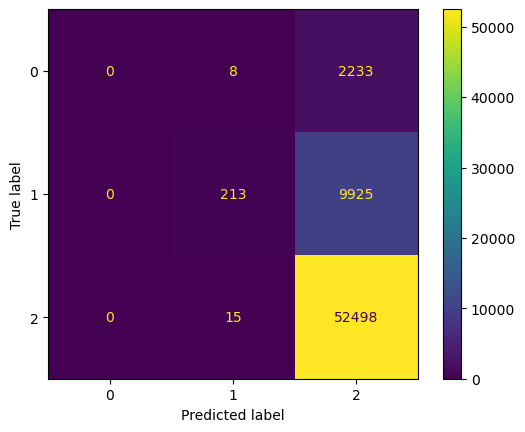

In [144]:
label_test,final,vectorizer=funct(clf,X_train,X_test,y_train,y_test)

In [145]:
final.Predict.value_counts()

2    64656
1      236
Name: Predict, dtype: int64

#### Our multinomial model hasn't predicted any negative values

## CLASSIFIER 2- LOGISTIC REGRESSION

In [146]:
clf1=LogisticRegression()

In [149]:
def funct(classifier,input_train,input_test,label_train,label_test):
    vectorizer=TfidfVectorizer(sublinear_tf=True,max_df=0.5,min_df=1,stop_words=stopwords.words('english'),use_idf=True,smooth_idf=True)
    X_train=vectorizer.fit_transform(input_train)
    X_test=vectorizer.transform(input_test)
    clf1=classifier.fit(X_train,label_train)
    y_pred=clf1.predict(X_test)
    plot_confusion_matrix(clf1,X_test,label_test)
    print(classification_report(label_test,y_pred))
    print('accuracy:', accuracy_score(label_test, y_pred))
    print('recall:', recall_score(label_test, y_pred, average='weighted'))
    print('f1-score:', f1_score(label_test, y_pred,average='weighted'))
    print('precision:', precision_score(label_test, y_pred, average='weighted'))
    final=pd.DataFrame(X_test)
    final['Predict']=y_pred
    return label_test,final,vectorizer

              precision    recall  f1-score   support

           0       0.72      0.29      0.41      2241
           1       0.76      0.71      0.73     10138
           2       0.94      0.98      0.96     52513

    accuracy                           0.91     64892
   macro avg       0.81      0.66      0.70     64892
weighted avg       0.91      0.91      0.91     64892

accuracy: 0.9147968932996363
recall: 0.9147968932996363
f1-score: 0.9078776379810807
precision: 0.9082918383052275


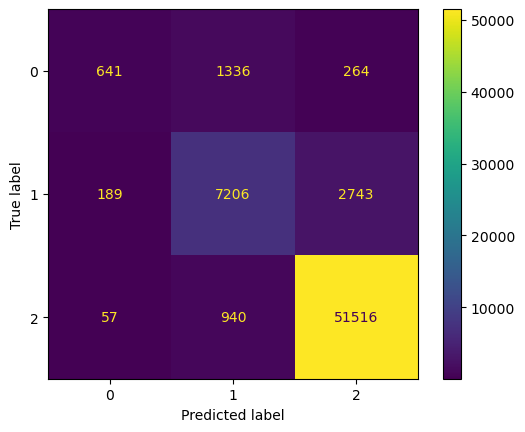

In [150]:
label_test,final,vectorizer=funct(clf1,X_train,X_test,y_train,y_test)

### Better than Multinomial model

## CLASSIFIER 3 - OVR  CLASSIFIER

In [156]:
lr = LogisticRegression(max_iter=200, verbose=1)
clf2=OneVsRestClassifier(lr)

In [157]:
def funct(classifier,input_train,input_test,label_train,label_test):
    vectorizer=TfidfVectorizer(sublinear_tf=True,max_df=0.5,min_df=1,stop_words=stopwords.words('english'),use_idf=True,smooth_idf=True)
    X_train=vectorizer.fit_transform(input_train)
    X_test=vectorizer.transform(input_test)
    clf3=classifier.fit(X_train,label_train)
    y_pred=clf2.predict(X_test)
    plot_confusion_matrix(clf2,X_test,label_test)
    print(classification_report(label_test,y_pred))
    print('accuracy:', accuracy_score(label_test, y_pred))
    print('recall:', recall_score(label_test, y_pred, average='weighted'))
    print('f1-score:', f1_score(label_test, y_pred,average='weighted'))
    print('precision:', precision_score(label_test, y_pred, average='weighted'))
    final=pd.DataFrame(X_test)
    final['Predict']=y_pred
    return label_test,final,vectorizer

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    5.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    5.5s finished


              precision    recall  f1-score   support

           0       0.74      0.19      0.30      2241
           1       0.75      0.66      0.70     10138
           2       0.93      0.99      0.96     52513

    accuracy                           0.91     64892
   macro avg       0.81      0.61      0.65     64892
weighted avg       0.90      0.91      0.90     64892

accuracy: 0.9069068606299698
recall: 0.9069068606299698
f1-score: 0.8957923537203606
precision: 0.8983640657237631


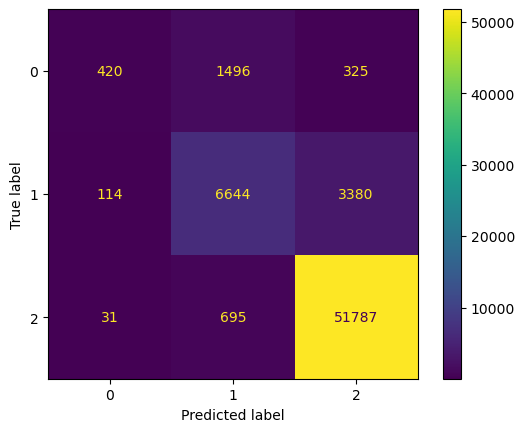

In [158]:
label_test,final,vectorizer=funct(clf2,X_train,X_test,y_train,y_test)

## CLASSIFIER 4:- AdaBoostClassifier

In [159]:
from sklearn.ensemble import AdaBoostClassifier
clf3=AdaBoostClassifier()

In [162]:
def funct(classifier,input_train,input_test,label_train,label_test):
    vectorizer=TfidfVectorizer(sublinear_tf=True,max_df=0.5,min_df=1,stop_words=stopwords.words('english'),use_idf=True,smooth_idf=True)
    X_train=vectorizer.fit_transform(input_train)
    X_test=vectorizer.transform(input_test)
    clf3=classifier.fit(X_train,label_train)
    y_pred=clf3.predict(X_test)
    plot_confusion_matrix(clf3,X_test,label_test)
    print(classification_report(label_test,y_pred))
    print('accuracy:', accuracy_score(label_test, y_pred))
    print('recall:', recall_score(label_test, y_pred, average='weighted'))
    print('f1-score:', f1_score(label_test, y_pred,average='weighted'))
    print('precision:', precision_score(label_test, y_pred, average='weighted'))
    final=pd.DataFrame(X_test)
    final['Predict']=y_pred
    return label_test,final,vectorizer

              precision    recall  f1-score   support

           0       0.72      0.13      0.23      2241
           1       0.57      0.67      0.61     10138
           2       0.93      0.93      0.93     52513

    accuracy                           0.86     64892
   macro avg       0.74      0.58      0.59     64892
weighted avg       0.87      0.86      0.86     64892

accuracy: 0.8632805276459348
recall: 0.8632805276459348
f1-score: 0.857661633917979
precision: 0.8670338231864108


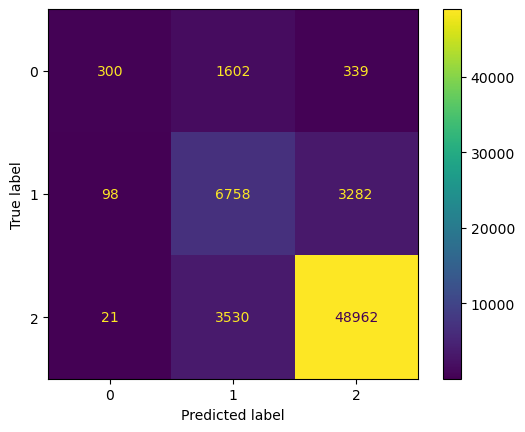

In [163]:
label_test,final,vectorizer=funct(clf3,X_train,X_test,y_train,y_test)

### Logistic regression has the best features with accuracy above 90

### But our data was imbalanced, let's balance our data using smote

In [164]:
X=test['reviews']
y=test['textblob_sentiment']

In [165]:
vectorizer=TfidfVectorizer(sublinear_tf=True,max_df=0.5,min_df=1,stop_words=stopwords.words('english'),use_idf=True,smooth_idf=True)
X=vectorizer.fit_transform(X) #vectorizing the x 

In [167]:
from imblearn.over_sampling import SMOTE
smt = SMOTE(random_state=0)
X,y=smt.fit_resample(X,y)
#splitting the data into train and test spli
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=20)

## CLASSIFIER 1 - MULTINOMIAL NB

              precision    recall  f1-score   support

           0       0.82      0.92      0.87     52457
           1       0.83      0.56      0.67     52432
           2       0.73      0.88      0.80     52654

    accuracy                           0.79    157543
   macro avg       0.79      0.79      0.78    157543
weighted avg       0.79      0.79      0.78    157543

accuracy: 0.7869978355115747
recall: 0.7869978355115747
f1-score: 0.7785256385640497
precision: 0.7944075223305559


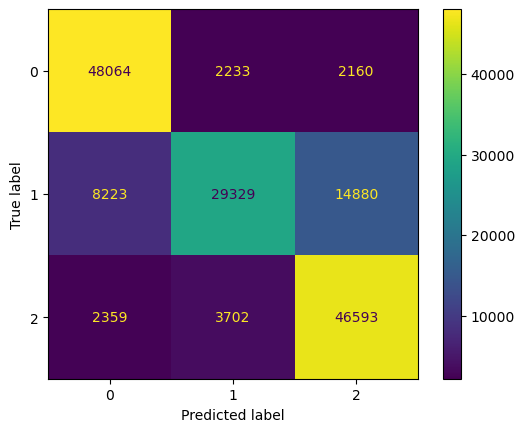

In [168]:
mul = MultinomialNB()
clf1=mul.fit(X_train,y_train)
y_pred=clf1.predict(X_test)
plot_confusion_matrix(clf1,X_test,y_test)
print(classification_report(y_test,y_pred))
print('accuracy:', accuracy_score(y_test, y_pred))
print('recall:', recall_score(y_test, y_pred, average='weighted'))
print('f1-score:', f1_score(y_test, y_pred,average='weighted'))
print('precision:', precision_score(y_test, y_pred, average='weighted'))

## CLASSIFIER 2 - LOGISTIC REGRESSION

              precision    recall  f1-score   support

           0       0.92      0.94      0.93     52457
           1       0.89      0.89      0.89     52432
           2       0.93      0.91      0.92     52654

    accuracy                           0.91    157543
   macro avg       0.91      0.91      0.91    157543
weighted avg       0.91      0.91      0.91    157543

accuracy: 0.9111861523520562
recall: 0.9111861523520562
f1-score: 0.9111212138450371
precision: 0.9112122294854075


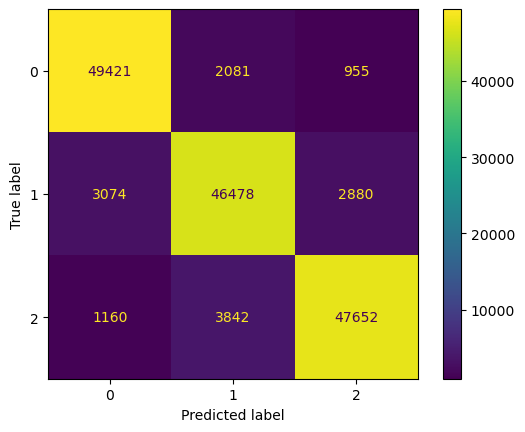

In [169]:
lr=LogisticRegression()

clf=lr.fit(X_train,y_train)
y_pred=clf.predict(X_test)
plot_confusion_matrix(clf,X_test,y_test)
print(classification_report(y_test,y_pred))
print('accuracy:', accuracy_score(y_test, y_pred))
print('recall:', recall_score(y_test, y_pred, average='weighted'))
print('f1-score:', f1_score(y_test, y_pred,average='weighted'))
print('precision:', precision_score(y_test, y_pred, average='weighted'))


## CLASSIFIER 3 - OVR

In [170]:
lr = LogisticRegression(max_iter=200, verbose=1)
clf3=OneVsRestClassifier(lr)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   14.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   15.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   14.8s finished


              precision    recall  f1-score   support

           0       0.91      0.95      0.93     52457
           1       0.90      0.86      0.88     52432
           2       0.91      0.91      0.91     52654

    accuracy                           0.91    157543
   macro avg       0.91      0.91      0.91    157543
weighted avg       0.91      0.91      0.91    157543

accuracy: 0.9062922503697404
recall: 0.9062922503697404
f1-score: 0.905907674030907
precision: 0.9061146651832197


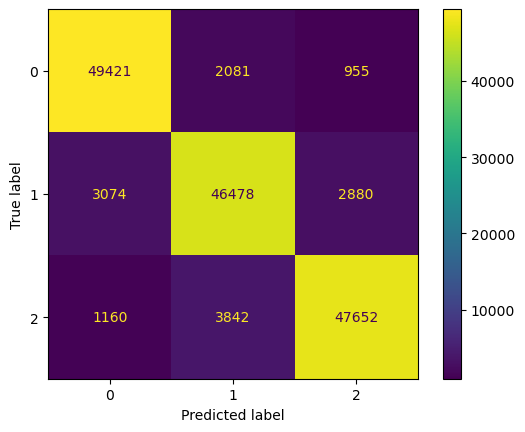

In [172]:
clf3=clf3.fit(X_train,y_train)
y_pred=clf3.predict(X_test)
plot_confusion_matrix(clf,X_test,y_test)
print(classification_report(y_test,y_pred))
print('accuracy:', accuracy_score(y_test, y_pred))
print('recall:', recall_score(y_test, y_pred, average='weighted'))
print('f1-score:', f1_score(y_test, y_pred,average='weighted'))
print('precision:', precision_score(y_test, y_pred, average='weighted'))

## CLASSIFIER 4 - ADABOOST

              precision    recall  f1-score   support

           0       0.79      0.62      0.69     52457
           1       0.62      0.78      0.69     52432
           2       0.84      0.82      0.83     52654

    accuracy                           0.74    157543
   macro avg       0.75      0.74      0.74    157543
weighted avg       0.75      0.74      0.74    157543

accuracy: 0.7370749573132415
recall: 0.7370749573132415
f1-score: 0.7377441672279063
precision: 0.7514288892664758


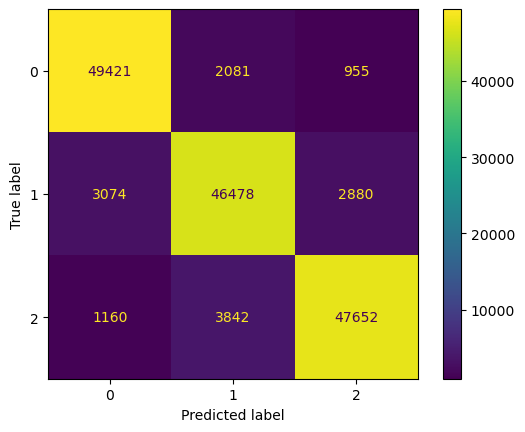

In [173]:
ada=AdaBoostClassifier()
clf4=ada.fit(X_train,y_train)
y_pred=clf4.predict(X_test)
plot_confusion_matrix(clf,X_test,y_test)
print(classification_report(y_test,y_pred))
print('accuracy:', accuracy_score(y_test, y_pred))
print('recall:', recall_score(y_test, y_pred, average='weighted'))
print('f1-score:', f1_score(y_test, y_pred,average='weighted'))
print('precision:', precision_score(y_test, y_pred, average='weighted'))


### For IMBALANCED DATA LOGISTIC REGRESSION

accuracy: 0.9147968932996363

recall: 0.9147968932996363

f1-score: 0.9078776379810807

precision: 0.9082918383052275

### For Balanced data

accuracy: 0.9111861523520562
    
recall: 0.9111861523520562
    
f1-score: 0.9111212138450371
    
precision: 0.9112122294854075

### Not a big differnece between balanced and imbalanaced data

## For PRediction

In [176]:
def sentimeny1(f):
    if f['Prediction'] == 0 :
        value = 'Negative'
    elif f['Prediction'] == 1:
      value = 'Neutral'
    else:
        value = 'Positive'
    return value

## CLUSTERING

In [186]:
df_prod=df_final.groupby('product_id').mean()[['ratings','polarity']]
df_prod.head(2)

,ratings,polarity
product_id,,
0739079891,3.8,0.316902
0786615206,4.4,0.064339


In [187]:
df_prod.reset_index(inplace=True)

In [188]:
df_prod.shape

(10301, 3)

In [189]:
df_prod.head(3)

,product_id,ratings,polarity
0,0739079891,3.800000,0.316902
1,0786615206,4.400000,0.064339
2,1480360295,3.588235,0.183881


In [190]:
df_cl=pd.merge(df_final_ex,df_prod,on='product_id',how='inner')
df_cl.head()

,ratings_x,verified,reviewTime,reviewerID,reviewerName,brand,title,product_id,price,month,year,reviews,cleaned_reviews,ratings_y,polarity
0,5.0,True,2016-10-30,A3FO5AKVTFRCRJ,francisco,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,10,2016,Five Stars It's good for beginners,five stars good beginners,3.8,0.316902
1,5.0,True,2016-06-30,A3UCGC1DHFMBCE,Eb Jack Murray,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,6,2016,Five Stars I recommend this starter Ukulele ki...,five stars recommend starter ukulele kit youne...,3.8,0.316902
2,5.0,True,2016-05-09,A2S9SLRYLPGYZB,Clara LaMarr,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,5,2016,Learning new songs to play regularly G'daughte...,learning new songs play regularly gdaughter re...,3.8,0.316902
3,4.0,True,2016-04-10,A15RTJWPG8OKOE,Eagle80,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,4,2016,A bargain-bin good-enough ukulele that's held ...,bargainbin goodenough ukulele thats held years...,3.8,0.316902
4,1.0,True,2016-02-06,A12ET1WO3OAVU7,Amazon Customer,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,2,2016,Poor Quality product. Please pay attention bet...,poor quality product pay attention better revi...,3.8,0.316902


In [192]:
df_clust_avg=df_cl[['ratings_y','polarity']]
df_clust_avg.head(3)

,ratings_y,polarity
0,3.8,0.316902
1,3.8,0.316902
2,3.8,0.316902


In [194]:
min(df_cl['polarity'])

-0.16666666666666666

In [195]:
df_clust_avg.shape

(216306, 2)

### STANDARDISATION

In [196]:
from sklearn.preprocessing import MinMaxScaler

In [197]:
scaler=MinMaxScaler()

In [198]:
df_scaled=scaler.fit_transform(df_clust_avg)

In [199]:
scaled_df=pd.DataFrame(df_scaled,columns=['rating', 'polarity'])
scaled_df.head()

,rating,polarity
0,0.7,0.414487
1,0.7,0.414487
2,0.7,0.414487
3,0.7,0.414487
4,0.7,0.414487


## KMeans 

In [200]:
from sklearn.cluster import KMeans

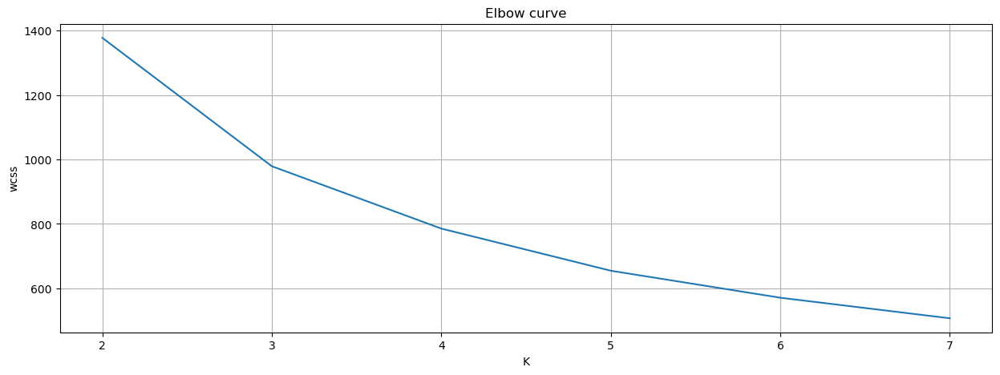

In [201]:
wcss = []                   #Within Cluster sum of Squared errors
for k in range(2, 8):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)

fig = plt.figure(figsize=(15, 5))
plt.plot(range(2, 8), wcss)
plt.grid(True)
plt.xlabel('K')
plt.ylabel('wcss')
plt.title('Elbow curve');

### Optimal value of K is 3 from Elbow method

In [202]:
k=3
model_kmeans=KMeans(n_clusters=k)
y_pred_model_kmeans=model_kmeans.fit_predict(df_scaled)

In [203]:
df_scaled.shape

(216306, 2)

In [204]:
cluster_name=[]
sil_scores=[]

In [205]:
from sklearn.metrics import silhouette_score

In [206]:
sil_scores.append(silhouette_score(df_scaled,y_pred_model_kmeans))
cluster_name.append('KMeans')

In [207]:
cluster_name,sil_scores

(['KMeans'], [0.3880897801837955])

In [208]:
scaled_df['cluster_label']=y_pred_model_kmeans

In [209]:
scaled_df.head(2)

,rating,polarity,cluster_label
0,0.7,0.414487,2
1,0.7,0.414487,2


In [210]:
df_clust_avg['cluster_label']=y_pred_model_kmeans

In [211]:
df_clust_avg

,ratings_y,polarity,cluster_label
0,3.8,0.316902,2
1,3.8,0.316902,2
...,...,...,...
216304,4.0,0.393232,0
216305,4.0,0.393232,0


In [212]:
df_clust_avg.cluster_label.value_counts()

1    100407
0     90739
2     25160
Name: cluster_label, dtype: int64

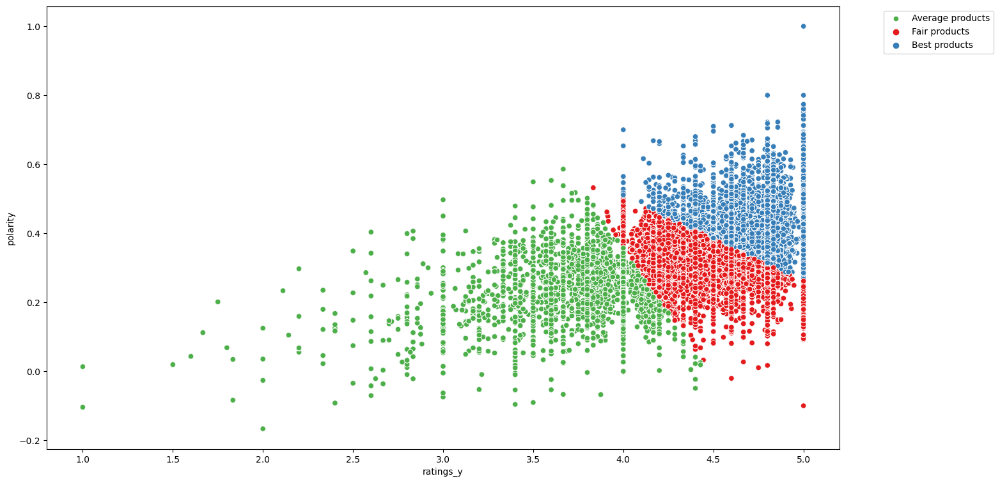

In [215]:
plt.figure(figsize=(16,9))
sns.scatterplot(data=df_clust_avg,x='ratings_y',y='polarity',hue='cluster_label',palette='Set1')
plt.legend(bbox_to_anchor=[1.05,1],labels=['Average products','Fair products','Best products']);

## AGGLOMERATIVE

In [217]:
df_scaled.shape

(216306, 2)

In [226]:
df_scaled1=df_scaled[:5000,:]

In [227]:
scaled_df1=scaled_df[:5000]

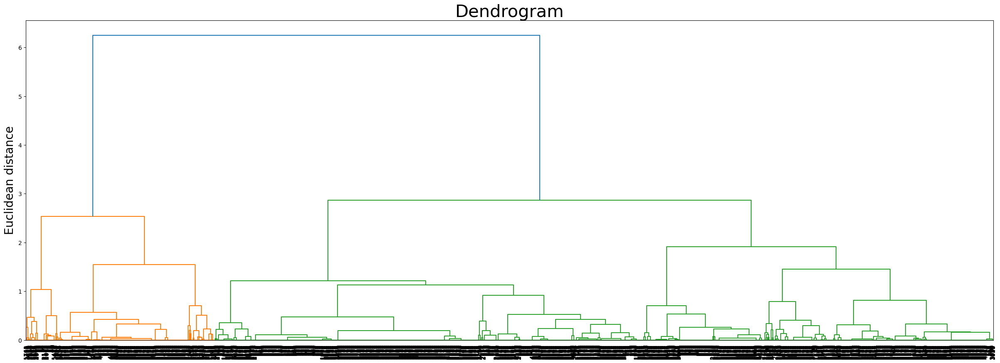

In [228]:
import scipy.cluster.hierarchy as sch
plt.figure(figsize=(30, 10))
dendrogrm = sch.dendrogram(sch.linkage(df_scaled1, method = 'ward'),labels=scaled_df1.index)
#plt.axhline(y=12.5, color='r', linestyle='--')
ax = plt.gca()
ax.tick_params(axis='x', which='major', labelsize=10)
plt.title('Dendrogram',fontsize=30)

plt.ylabel('Euclidean distance', fontsize=20)
plt.show()

In [230]:
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'ward')
y_hc = hc.fit_predict(df_scaled1)

In [231]:
silhouette_score(df_scaled1,y_hc)

0.37815237367842264

In [233]:
df_clust_avg

,ratings_y,polarity,cluster_label
0,3.8,0.316902,2
1,3.8,0.316902,2
...,...,...,...
216304,4.0,0.393232,0
216305,4.0,0.393232,0


In [236]:
cluster_name
sil_scores

[0.3880897801837955]

In [238]:
cluster_name.append('Agglomerative clustering')
sil_scores.append(silhouette_score(df_scaled1,y_hc))

In [239]:
sil_scores

[0.3880897801837955, 0.37815237367842264]

In [240]:
cluster_name,sil_scores

(['KMeans', 'Agglomerative clustering', 'Agglomerative clustering'],
 [0.3880897801837955, 0.37815237367842264])

In [241]:
cluster_name.remove('Agglomerative clustering')

In [242]:
df_comp_clust=pd.DataFrame({"model":cluster_name,"silhoutte_score":sil_scores})
df_comp_clust

,model,silhoutte_score
0,KMeans,0.388090
1,Agglomerative clustering,0.378152


### Assigning names to our clusters

In [244]:
df_cl['K_means_labels']=df_clust_avg['cluster_label']

In [252]:
df_cl['K_means_labels'].value_counts()

Fair products       100407
Average products     90739
Best products        25160
Name: K_means_labels, dtype: int64

In [249]:
df_cl['K_means_labels'].replace({0:'Average products',2:'Best products',1:'Fair products'},inplace=True)

In [250]:
best_products=df_cl[df_cl['K_means_labels']=='Best products']
fair_products=df_cl[df_cl['K_means_labels']=='Fair products']
average_products=df_cl[df_cl['K_means_labels']=='Average products']

In [251]:
best_products.shape,fair_products.shape,average_products.shape

((25160, 16), (100407, 16), (90739, 16))

In [253]:
fair_products['price'].mean(),best_products['price'].mean(),average_products['price'].mean()

(20.163264072050286, 20.254954151065697, 21.8100202445932)

#### Negative

In [664]:
df_cl[df_cl['brand']=='wmm']['price'].mean()

15.99

#### neutral

In [666]:
df_cl[df_cl['brand']=="D'Addario"]['price'].mean()

20.682966642878526

#### best

In [667]:
df_cl[df_cl['brand']=='Behringer']['price'].mean()

17.650966499364504

In [662]:
best_products.groupby(by=['brand'])['ratings_x'].value_counts().sort_values(ascending=False)

brand                                   ratings_x
Behringer                               5.0          707
Pyle                                    5.0          365
Behringer                               4.0          336
Fender                                  5.0          312
Neewer                                  5.0          297
JIM DUNLOP                              5.0          268
Behringer                               3.0          225
Kmise                                   5.0          216
Pyle                                    4.0          163
Behringer                               1.0          161
Neewer                                  4.0          156
Behringer                               2.0          151
OnStage                                 5.0          149
D'Addario Accessories                   5.0          148
Yamaha                                  5.0          140
Fender                                  4.0          134
JIM DUNLOP                            

In [659]:
fair_products.groupby(by=['brand'])['ratings_x'].value_counts().sort_values(ascending=False)

brand                                         ratings_x
D'Addario                                     5.0          10150
Fender                                        5.0           4166
Elixir                                        5.0           3833
JIM DUNLOP                                    5.0           3668
Snark                                         5.0           2967
Ernie Ball                                    5.0           2021
D'Addario Accessories                         5.0           1744
GLS Audio                                     5.0           1706
D'Addario                                     4.0           1618
Yamaha                                        5.0           1229
Shure                                         5.0           1097
Martin                                        5.0           1082
Kyser                                         5.0           1075
Hosa                                          5.0           1054
OnStage                           

In [661]:
average_products.groupby(by=['brand'])['ratings_x'].value_counts().sort_values(ascending=True)

brand                                     ratings_x
wmm                                       1.0             1
Phitz                                     2.0             1
Guitar bass tuning pegs                   3.0             1
Chesbro Music                             1.0             1
                                          2.0             1
Guitar bass pin&nut&saddle&endpin         4.0             1
                                          3.0             1
Chinatera                                 3.0             1
Guitar Triller                            2.0             1
Phonic                                    4.0             1
TKL                                       3.0             1
Photogitems                               3.0             1
TC Helicon                                2.0             1
Pick Geek                                 2.0             1
T-Rex                                     2.0             1
Switchcraft                               3.0   

In [663]:
fair_products['price'].mean(),best_products['price'].mean(),average_products['price'].mean()

(20.163264072050286, 20.254954151065697, 21.8100202445932)

# TIME SERIES

In [254]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller,acf,pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import warnings
warnings.filterwarnings('ignore')

In [255]:
from pylab import rcParams
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import train_test_split

# dickey fuller test for stationarity check
from statsmodels.tsa.stattools import adfuller,acf,pacf
from statsmodels.tsa.statespace.tools import diff

# Modelling imports
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.arima.model import ARIMA

In [256]:
df_final

,ratings,verified,reviewTime,reviewerID,reviewerName,brand,title,product_id,price,month,year,reviews,cleaned_reviews,token_nltk,stem_reviews,polarity,textblob_sentiment
0,5.0,True,2016-10-30,A3FO5AKVTFRCRJ,francisco,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,10,2016,Five Stars It's good for beginners,five stars good beginners,"[five, stars, good, beginners]",five star good beginn,0.700000,positive
1,5.0,True,2016-06-30,A3UCGC1DHFMBCE,Eb Jack Murray,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,6,2016,Five Stars I recommend this starter Ukulele ki...,five stars recommend starter ukulele kit youne...,"[five, stars, recommend, starter, ukulele, kit...",five star recommend starter ukulel kit youne l...,0.000000,neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
279865,1.0,True,2017-05-27,A1KRL5ZRON6DPT,Jude the Obscure,Greenten,Greenten Wiring Harness Prewired 2V2T 3-Way To...,B01HIDOPP2,1.96000,5,2017,Not as described. The description stated they ...,not described description stated size pots not...,"[not, described, description, stated, size, po...",not describ descript state size pot not sent,0.000000,neutral
279866,5.0,True,2017-03-24,A3QN3W0PJ1DXIT,Doug Clayburg,Greenten,Greenten Wiring Harness Prewired 2V2T 3-Way To...,B01HIDOPP2,1.96000,3,2017,"Works great They are dime size not ""full size""...",works great dime size not size pots nicely con...,"[works, great, dime, size, not, size, pots, ni...",work great dime size not size pot nice constru...,0.733333,positive


In [257]:
df_final.shape

(216306, 17)

In [258]:
df_time=df_final.copy()

In [259]:
df_time['Date'] = pd.to_datetime(df_time['reviewTime'])
df_time = df_time.set_index('Date')
df_time.head(5)

,ratings,verified,reviewTime,reviewerID,reviewerName,brand,title,product_id,price,month,year,reviews,cleaned_reviews,token_nltk,stem_reviews,polarity,textblob_sentiment
Date,,,,,,,,,,,,,,,,,
2016-10-30,5.0,True,2016-10-30,A3FO5AKVTFRCRJ,francisco,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,10,2016,Five Stars It's good for beginners,five stars good beginners,"[five, stars, good, beginners]",five star good beginn,0.700000,positive
2016-06-30,5.0,True,2016-06-30,A3UCGC1DHFMBCE,Eb Jack Murray,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,6,2016,Five Stars I recommend this starter Ukulele ki...,five stars recommend starter ukulele kit youne...,"[five, stars, recommend, starter, ukulele, kit...",five star recommend starter ukulel kit youne l...,0.000000,neutral
2016-05-09,5.0,True,2016-05-09,A2S9SLRYLPGYZB,Clara LaMarr,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,5,2016,Learning new songs to play regularly G'daughte...,learning new songs play regularly gdaughter re...,"[learning, new, songs, play, regularly, gdaugh...",learn new song play regular gdaughter receiv c...,0.045455,neutral
2016-04-10,4.0,True,2016-04-10,A15RTJWPG8OKOE,Eagle80,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,4,2016,A bargain-bin good-enough ukulele that's held ...,bargainbin goodenough ukulele thats held years...,"[bargainbin, goodenough, ukulele, thats, held,...",bargainbin goodenough ukulel that held year st...,0.244619,positive
2016-02-06,1.0,True,2016-02-06,A12ET1WO3OAVU7,Amazon Customer,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,2,2016,Poor Quality product. Please pay attention bet...,poor quality product pay attention better revi...,"[poor, quality, product, pay, attention, bette...",poor qualiti product pay attent better review ...,0.144643,positive


In [297]:
pd.set_option('display.max_rows',5)

In [524]:
df_positive=df_time[df_time['textblob_sentiment']=='positive']
df_negative=df_time[df_time['textblob_sentiment']=='negative']
df_neutral=df_time[df_time['textblob_sentiment']=='neutral']


In [302]:
df_positive.head(2)

,ratings,verified,reviewTime,reviewerID,reviewerName,brand,title,product_id,price,month,year,reviews,cleaned_reviews,token_nltk,stem_reviews,polarity,textblob_sentiment
Date,,,,,,,,,,,,,,,,,
2016-10-30,5.0,True,2016-10-30,A3FO5AKVTFRCRJ,francisco,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,10,2016,Five Stars It's good for beginners,five stars good beginners,"[five, stars, good, beginners]",five star good beginn,0.700000,positive
2016-04-10,4.0,True,2016-04-10,A15RTJWPG8OKOE,Eagle80,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,4,2016,A bargain-bin good-enough ukulele that's held ...,bargainbin goodenough ukulele thats held years...,"[bargainbin, goodenough, ukulele, thats, held,...",bargainbin goodenough ukulel that held year st...,0.244619,positive


In [303]:
df_negative.head(2)

,ratings,verified,reviewTime,reviewerID,reviewerName,brand,title,product_id,price,month,year,reviews,cleaned_reviews,token_nltk,stem_reviews,polarity,textblob_sentiment
Date,,,,,,,,,,,,,,,,,
2017-04-07,2.0,True,2017-04-07,A3N3ZJ34MFE3NQ,eric rodriguez,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,4,2017,Too expensive Great starter kit. Comes with bo...,expensive great starter kit comes booklet cds ...,"[expensive, great, starter, kit, comes, bookle...",expens great starter kit come booklet cds abit...,-0.105952,negative
2015-03-26,3.0,True,2015-03-26,A1UYHCCPQKH6GN,andrew greaves,ChordBuddy,ChordBuddy Guitar Learning System for Right Ha...,1480360295,6.04000,3,2015,not as good as i thought it would be but seein...,not good thought seeing not good thought seein...,"[not, good, thought, seeing, not, good, though...",not good thought see not good thought see tool...,-0.116667,negative


In [305]:

df_neutral.sample(2)

,ratings,verified,reviewTime,reviewerID,reviewerName,brand,title,product_id,price,month,year,reviews,cleaned_reviews,token_nltk,stem_reviews,polarity,textblob_sentiment
Date,,,,,,,,,,,,,,,,,
2014-04-07,1.0,True,2014-04-07,A1H016EIN0CLEZ,M. Parrott,Arriba Cases,Arriba Cases Ac-140 Padded Gear Transport Bag ...,B000HZGFMA,55.95000,4,2014,Stitching came apart in 3 places. Very disappo...,stitching came apart places disappointed stitc...,"[stitching, came, apart, places, disappointed,...",stitch came apart place disappoint stitch hold...,-0.064301,neutral
2013-03-14,1.0,True,2013-03-14,A1VV5IDIWZVFN7,kenjaudio,Numark,"Numark iDJ Live | DJ Controller for iPad, iPho...",B004JPPO94,18.53982,3,2013,Don't waste your money Dont buy it! I love Num...,dont waste money dont buy love numark products...,"[dont, waste, money, dont, buy, love, numark, ...",dont wast money dont buy love numark product h...,0.028571,neutral


### Now lets plot graphs for the best product with high positive sentiments

In [307]:
prod_id=pd.DataFrame(df_positive.groupby(by=['product_id','brand'])['textblob_sentiment'].count()).sort_values(by=['textblob_sentiment'],ascending=False).head(5)
prod_id

,,textblob_sentiment
product_id,brand,
B0002H03YY,D'Addario,1578
B0002H05BA,D'Addario,1578
B0002E3CK4,D'Addario,1578
B0006LOBA8,D'Addario,1578
B0002E1NWI,Elixir,1296


### So our brand is D'Addario  and id is B0002H03YY

In [308]:
# doing time series on product B00NPZI1ZS
time1=df_time[(df_time['product_id']=='B0002H03YY')]
time1.shape

(1866, 17)

In [309]:
time1.brand[:1]

Date
2018-04-29    D'Addario
Name: brand, dtype: object

In [326]:
df1=time1[['ratings']]
df1.head()

,ratings
Date,
2018-04-29,5.0
2018-04-19,5.0
2018-04-19,5.0
2018-04-18,5.0
2018-04-16,5.0


In [327]:
df1_year=df1.resample('W').mean()

In [328]:
df1_year.isnull().sum()

ratings    270
dtype: int64

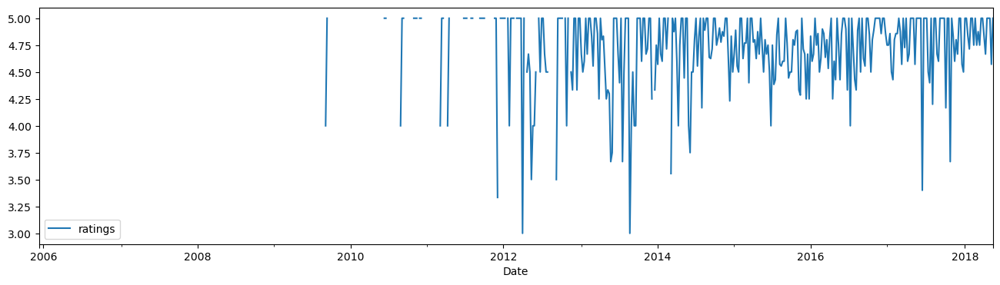

In [329]:
df1_year.plot()
plt.show()

In [318]:
df1_year.shape

(650, 1)

In [332]:
df1_year.dropna(inplace=True)

In [334]:
df1_year=df1_year[df1_year.index>'2013-01-01']

In [335]:
df1_year

,ratings
Date,
2013-01-06,4.666667
2013-01-13,4.500000
...,...
2018-05-13,4.571429
2018-05-20,5.000000


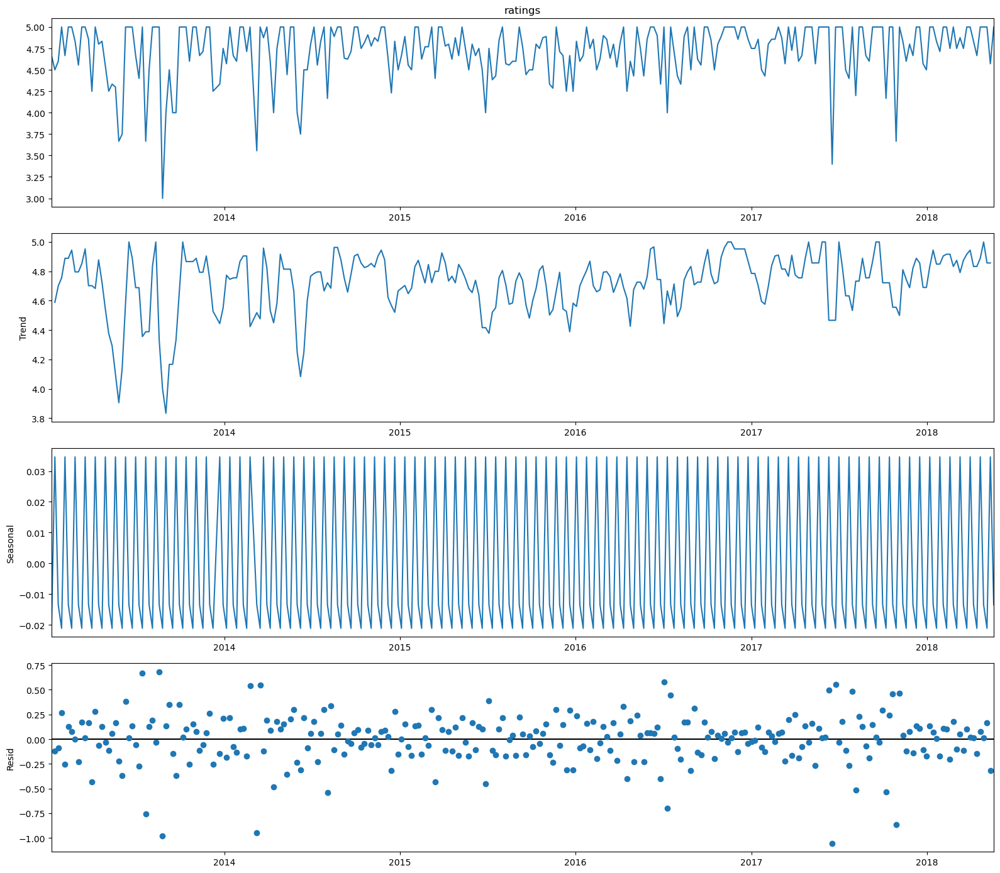

In [337]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 16, 14
decomposition = sm.tsa.seasonal_decompose(df1_year.ratings,model='additive',period=3) # additive seasonal index
fig = decomposition.plot()
plt.show()

### We have seasonality in our data

In [338]:
def checkStationarity(music3_df):
    pvalue = adfuller(music3_df)[1]
    '''
    output:-> 
    1) test statistic, 
    2) p-value, 
    3) number of lags, 
    4) total observations
    
    dfoutput = pd.Series(result[0:4],index=['tstat','pvalue','lags','obs'])
    pvalue = dfoutput['pvalue']
    '''
    
    if(pvalue>0.05):
        msg = 'p-value={}. Data is not stationary'.format(pvalue)
    else:
        msg='p-value={}. Data is stationary'.format(pvalue)
        
    return(msg)

In [339]:
checkStationarity(df1_year)

'p-value=8.868710943343099e-28. Data is stationary'

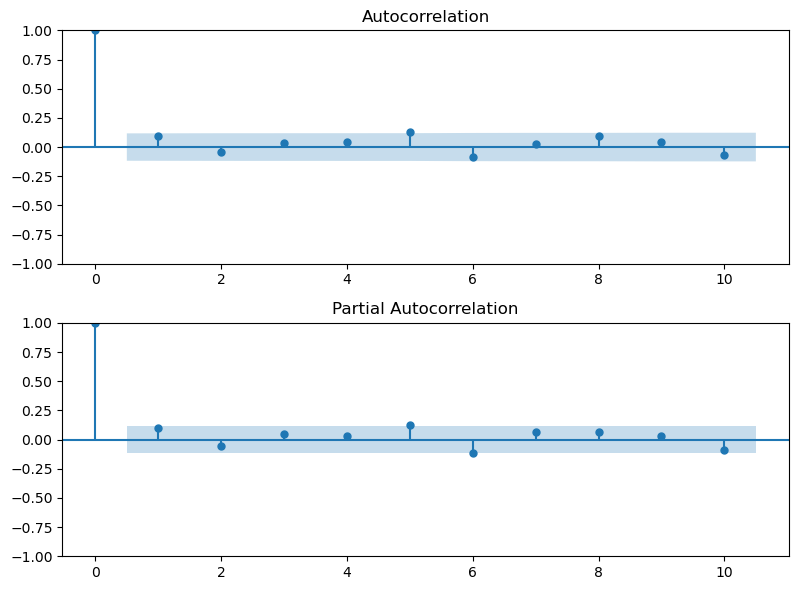

In [341]:
#draw Acf and Pacf plot
fig = plt.figure(figsize=(8, 6))

# Show ACF
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(df1_year, lags=10,ax=ax1)

# Show PACF
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(df1_year, lags=10, ax=ax2)

plt.tight_layout()

In [342]:
d=0; #ARMA 
lis=[]
for p in [1,2,3,4,5]:
    for q in [1,2,3,4,5]:
        lis.append((p,d,q))

# building model
model=[]
for i in lis:
    m = ARIMA(df1_year, order=i).fit() # d=0 becomes ARMA
    model.append(m)

# checking model is good or not
c=1
for i in model:
    pvalue = sm.stats.acorr_ljungbox(i.resid, lags=[1], return_df=True)['lb_pvalue'].values
    if pvalue < 0.05:
        print(f'Model {c} Not a good model')
    else:
        print(f'Model {c} Good model')
    c+=1

Model 1 Good model
Model 2 Good model
Model 3 Good model
Model 4 Good model
Model 5 Good model
Model 6 Good model
Model 7 Good model
Model 8 Good model
Model 9 Good model
Model 10 Good model
Model 11 Good model
Model 12 Good model
Model 13 Good model
Model 14 Good model
Model 15 Good model
Model 16 Good model
Model 17 Good model
Model 18 Good model
Model 19 Good model
Model 20 Good model
Model 21 Good model
Model 22 Good model
Model 23 Good model
Model 24 Good model
Model 25 Good model


In [346]:
pd.set_option('display.max_rows',None)

In [347]:
# Arma
# calculating AIC and BIC score   
aic=[]
bic=[]
for i in model[0:]:
    aic.append(i.aic)
    bic.append(i.bic)

# predicting values
forecast=[]
for i in model[0:]:
    fcast = i.predict(start=0, end=len(df1_year)-1)
    forecast.append(fcast)

# calculating MSE and RMSE score
MSE = []
RMSE = []
for i in forecast:
    mse = mean_squared_error(df1_year, i)
    rmse = np.sqrt(mse)
    MSE.append(mse)
    RMSE.append(rmse)

# printing model numbers
model_no=[]
for i in range(0,len(model)):
    model_no.append('Model '+str(i))
    
# dataframe of all results
df_results = pd.DataFrame({'Model No.': model_no, '(p, d, q)':lis[0:], 'AIC': aic, 'BIC': bic, 'MSE': MSE, 'RMSE': RMSE})
df_results

,Model No.,"(p, d, q)",AIC,BIC,MSE,RMSE
0,Model 0,"(1, 0, 1)",167.750470,182.275317,0.103782,0.322152
1,Model 1,"(1, 0, 2)",171.438280,189.594339,0.104425,0.323149
2,Model 2,"(1, 0, 3)",171.636514,193.423785,0.103740,0.322086
3,Model 3,"(1, 0, 4)",173.512970,198.931452,0.103693,0.322014
4,Model 4,"(1, 0, 5)",170.494561,199.544255,0.101821,0.319094
5,Model 5,"(2, 0, 1)",169.708957,187.865015,0.103767,0.322129
6,Model 6,"(2, 0, 2)",169.596217,191.383488,0.102980,0.320905
7,Model 7,"(2, 0, 3)",171.485750,196.904232,0.102935,0.320835
8,Model 8,"(2, 0, 4)",173.421815,202.471510,0.102910,0.320796
9,Model 9,"(2, 0, 5)",169.151501,201.832407,0.100694,0.317323


In [348]:
print('Taking model with lowest RMSE score:')
df_results[df_results.RMSE==df_results.RMSE.min()]

Taking model with lowest RMSE score:


,Model No.,"(p, d, q)",AIC,BIC,MSE,RMSE
24,Model 24,"(5, 0, 5)",169.231455,212.805996,0.098764,0.314268


In [349]:
print('Taking model with lowest AIC score:')
df_results[df_results.AIC==df_results.AIC.min()]

Taking model with lowest AIC score:


,Model No.,"(p, d, q)",AIC,BIC,MSE,RMSE
0,Model 0,"(1, 0, 1)",167.75047,182.275317,0.103782,0.322152


In [350]:
model1 = ARIMA(df1_year,order=(3,d,4)).fit()
f1 = model1.predict(start=0,end=len(df1_year)-1)
f1

Date
2013-01-06    4.722904
2013-01-13    4.717604
2013-01-20    4.704336
2013-01-27    4.722893
2013-02-03    4.746109
2013-02-10    4.686743
2013-02-17    4.776839
2013-02-24    4.729591
2013-03-03    4.752700
2013-03-10    4.692779
2013-03-17    4.778818
2013-03-24    4.700006
2013-03-31    4.749337
2013-04-07    4.666115
2013-04-14    4.830164
2013-04-21    4.650582
2013-04-28    4.756246
2013-05-05    4.652439
2013-05-12    4.754512
2013-05-19    4.689592
2013-05-26    4.692090
2013-06-02    4.557296
2013-06-09    4.676717
2013-06-16    4.760229
2013-06-23    4.716281
2013-06-30    4.745564
2013-07-07    4.716521
2013-07-14    4.735064
2013-07-21    4.763976
2013-07-28    4.546728
2013-08-04    4.780314
2013-08-11    4.678307
2013-08-18    4.783197
2013-08-25    4.719045
2013-09-01    4.582967
2013-09-08    4.771157
2013-09-15    4.605439
2013-09-22    4.598117
2013-09-29    4.646390
2013-10-06    4.850757
2013-10-13    4.726645
2013-10-20    4.753842
2013-10-27    4.631610
2013-1

In [351]:
dfres=pd.DataFrame({'actual':df1_year.ratings, 'predict':f1.values})
dfres['error'] = dfres.actual - dfres.predict
dfres

,actual,predict,error
Date,,,
2013-01-06,4.666667,4.722904,-0.056237
2013-01-13,4.500000,4.717604,-0.217604
2013-01-20,4.600000,4.704336,-0.104336
2013-01-27,5.000000,4.722893,0.277107
2013-02-03,4.666667,4.746109,-0.079443
2013-02-10,5.000000,4.686743,0.313257
2013-02-17,5.000000,4.776839,0.223161
2013-02-24,4.833333,4.729591,0.103742
2013-03-03,4.555556,4.752700,-0.197145


In [352]:
l1=dfres[['actual']]
l2=dfres[['predict']]

<AxesSubplot:xlabel='Date'>

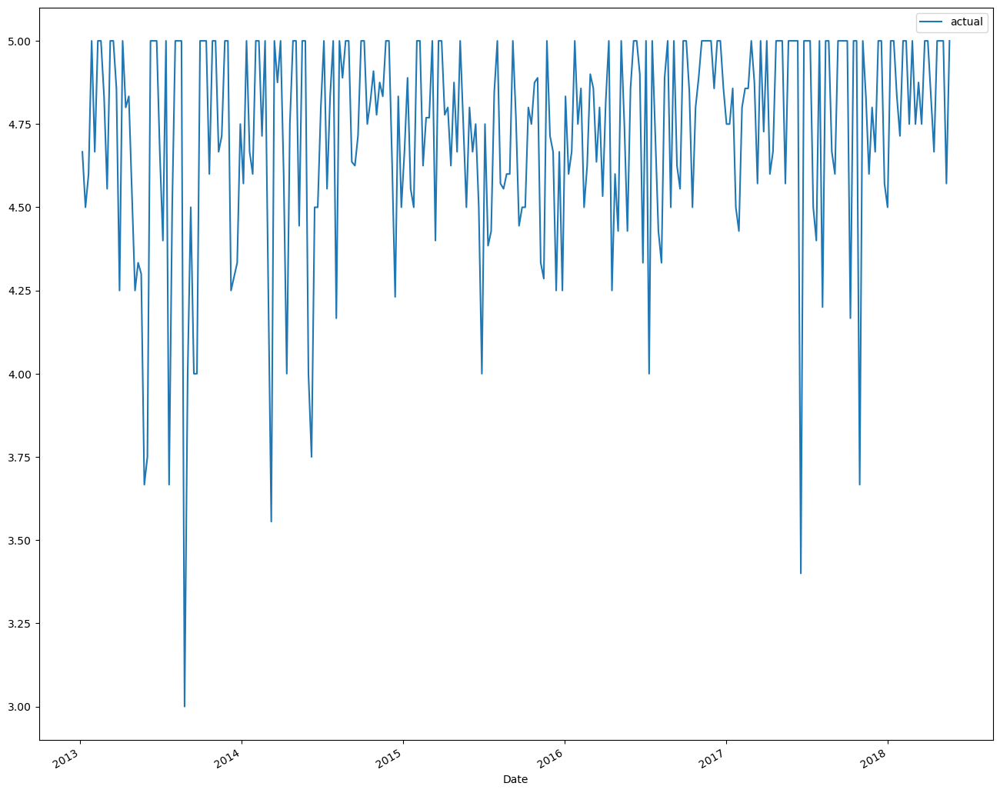

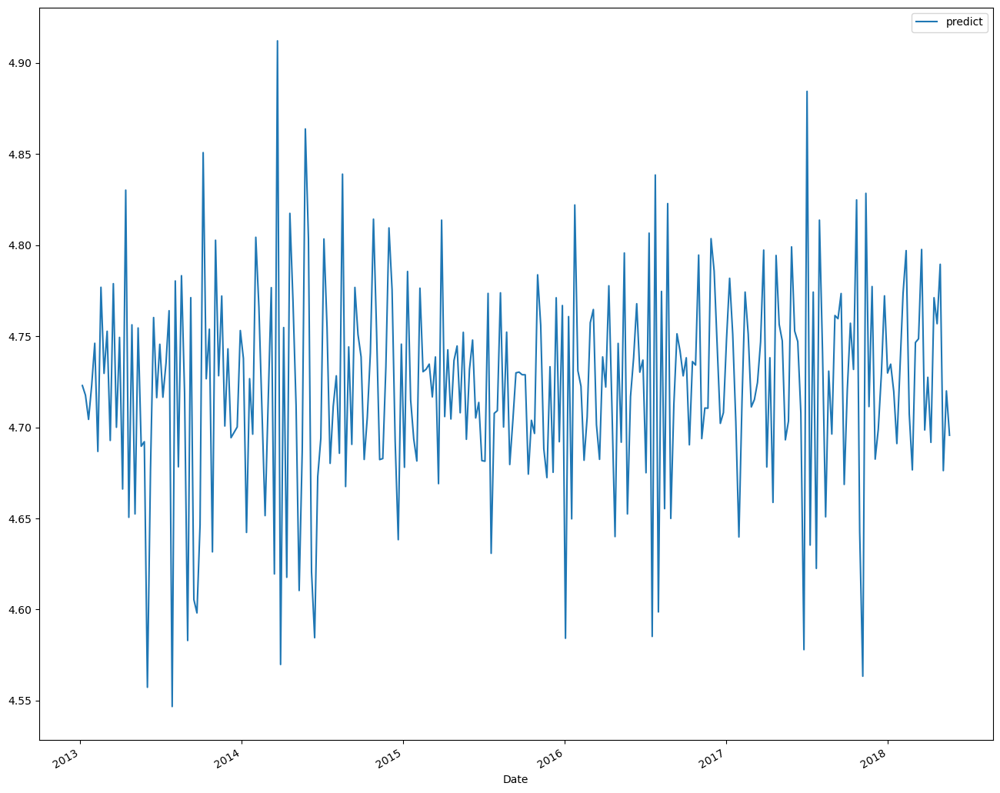

In [353]:
# plot the actual and forecast data of the test data
l1.plot()
l2.plot()

In [355]:
l2.tail()

,predict
Date,
2018-04-22,4.756857
2018-04-29,4.789458
2018-05-06,4.676219
2018-05-13,4.719963
2018-05-20,4.695614


## Forecasting values

In [466]:

import datetime
import pandas as pd
 
# initializing date
test_date = datetime.datetime.strptime("06-03-2018", "%m-%d-%Y")
 
# initializing K
K = 30
 
date_generated = pd.date_range(test_date, periods=K,freq='W')
print(date_generated.strftime("%d-%m-%Y"))

Index(['03-06-2018', '10-06-2018', '17-06-2018', '24-06-2018', '01-07-2018',
       '08-07-2018', '15-07-2018', '22-07-2018', '29-07-2018', '05-08-2018',
       '12-08-2018', '19-08-2018', '26-08-2018', '02-09-2018', '09-09-2018',
       '16-09-2018', '23-09-2018', '30-09-2018', '07-10-2018', '14-10-2018',
       '21-10-2018', '28-10-2018', '04-11-2018', '11-11-2018', '18-11-2018',
       '25-11-2018', '02-12-2018', '09-12-2018', '16-12-2018', '23-12-2018'],
      dtype='object')


In [467]:
date_generated

DatetimeIndex(['2018-06-03', '2018-06-10', '2018-06-17', '2018-06-24',
               '2018-07-01', '2018-07-08', '2018-07-15', '2018-07-22',
               '2018-07-29', '2018-08-05', '2018-08-12', '2018-08-19',
               '2018-08-26', '2018-09-02', '2018-09-09', '2018-09-16',
               '2018-09-23', '2018-09-30', '2018-10-07', '2018-10-14',
               '2018-10-21', '2018-10-28', '2018-11-04', '2018-11-11',
               '2018-11-18', '2018-11-25', '2018-12-02', '2018-12-09',
               '2018-12-16', '2018-12-23'],
              dtype='datetime64[ns]', freq='W-SUN')

In [468]:
forecast_1=pd.DataFrame()
forecast_1['Date']=date_generated
forecast_1.dtypes

Date    datetime64[ns]
dtype: object

In [469]:
forecast_1['Date']=pd.to_datetime(forecast_1['Date'])

In [470]:
forecast_1.set_index('Date',inplace=True)

In [471]:
v=[]
for i in model1.forecast(30):
    v.append(i)

In [472]:
forecast_1['Forecasted values1']=v

In [473]:
forecast_1

,Forecasted values1
Date,
2018-06-03,4.849542
2018-06-10,4.711988
2018-06-17,4.721028
2018-06-24,4.653528
2018-07-01,4.736444
2018-07-08,4.749110
2018-07-15,4.766422
2018-07-22,4.700238
2018-07-29,4.689281


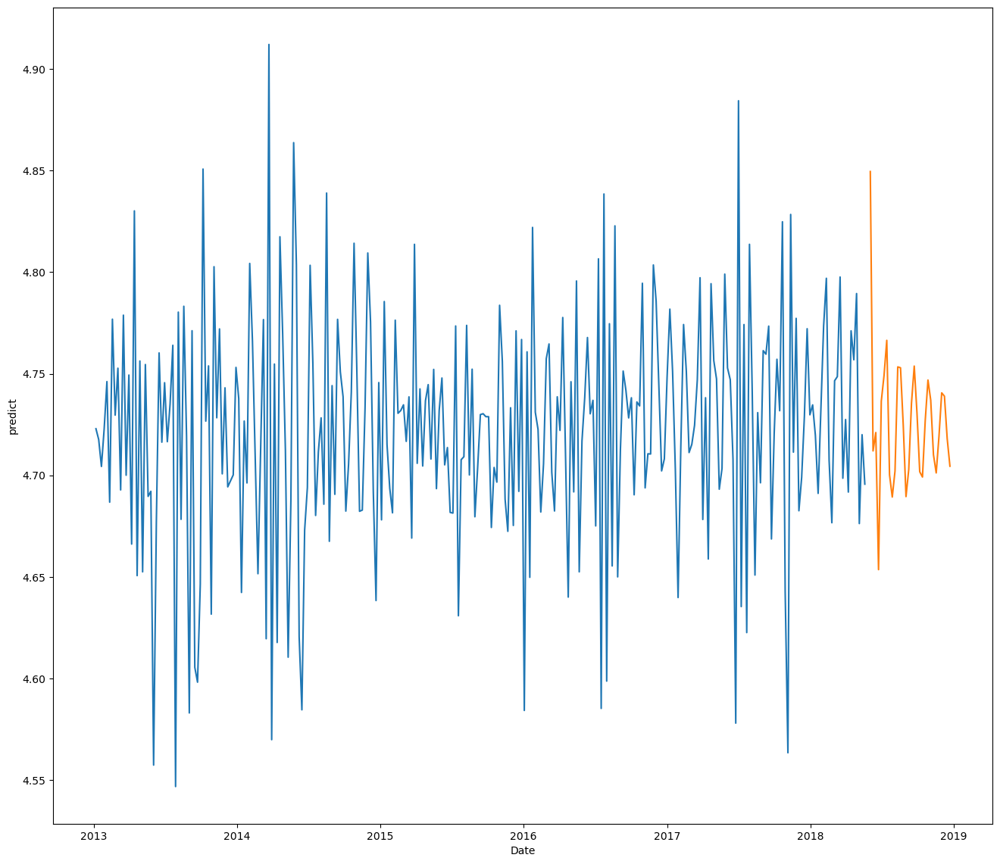

In [474]:
sns.lineplot(y=l2.predict,x=l1.index)
sns.lineplot(y=forecast_1['Forecasted values1'],x=forecast_1.index);

### We can see a downward trend for D'Addario brand in the coming 2 months

# SARIMA model

In [476]:
# for seasonal data, use the SARIMAX. start with initial values for p,d,q
p=0; q=0; d=0
P=0;Q=0;D=0 #( there is 1 repation occurs in acf and pcf graph thats why i have taken the P=1,Q=1 )
sarima_model = sm.tsa.statespace.SARIMAX(df1_year,order=(p,d,q),seasonal_order=(P,D,Q,12)).fit()

In [479]:
d=0; #ARMA 
lis=[]
for p in [1,2,3,4,5]:
    for q in [1,2,3,4,5]:
        lis.append((p,d,q))

# building model
model=[]
for i in lis:
    m = SARIMAX(df1_year, order=i).fit() # d=0 becomes ARMA
    model.append(m)

# checking model is good or not
c=1
for i in model:
    pvalue = sm.stats.acorr_ljungbox(i.resid, lags=[1], return_df=True)['lb_pvalue'].values
    if pvalue < 0.05:
        print(f'Model {c} Not a good model')
    else:
        print(f'Model {c} Good model')
    c+=1

Model 1 Good model
Model 2 Good model
Model 3 Good model
Model 4 Good model
Model 5 Good model
Model 6 Good model
Model 7 Good model
Model 8 Good model
Model 9 Good model
Model 10 Good model
Model 11 Good model
Model 12 Good model
Model 13 Good model
Model 14 Good model
Model 15 Good model
Model 16 Good model
Model 17 Good model
Model 18 Good model
Model 19 Good model
Model 20 Good model
Model 21 Good model
Model 22 Good model
Model 23 Good model
Model 24 Good model
Model 25 Good model


In [480]:
# Arma
# calculating AIC and BIC score   
aic=[]
bic=[]
for i in model[0:]:
    aic.append(i.aic)
    bic.append(i.bic)

# predicting values
forecast=[]
for i in model[0:]:
    fcast = i.predict(start=0, end=len(df1_year)-1)
    forecast.append(fcast)

# calculating MSE and RMSE score
MSE = []
RMSE = []
for i in forecast:
    mse = mean_squared_error(df1_year, i)
    rmse = np.sqrt(mse)
    MSE.append(mse)
    RMSE.append(rmse)

# printing model numbers
model_no=[]
for i in range(0,len(model)):
    model_no.append('Model '+str(i))
    
# dataframe of all results
df_results = pd.DataFrame({'Model No.': model_no, '(p, d, q)':lis[0:], 'AIC': aic, 'BIC': bic, 'MSE': MSE, 'RMSE': RMSE})
df_results

,Model No.,"(p, d, q)",AIC,BIC,MSE,RMSE
0,Model 0,"(1, 0, 1)",182.072427,192.966063,0.184840,0.429931
1,Model 1,"(1, 0, 2)",179.146026,193.670873,0.183648,0.428541
2,Model 2,"(1, 0, 3)",179.585878,197.741937,0.182994,0.427778
3,Model 3,"(1, 0, 4)",181.268296,203.055567,0.182888,0.427654
4,Model 4,"(1, 0, 5)",183.153621,208.572104,0.182832,0.427589
5,Model 5,"(2, 0, 1)",183.507949,198.032797,0.183947,0.428890
6,Model 6,"(2, 0, 2)",182.684193,200.840251,0.184180,0.429162
7,Model 7,"(2, 0, 3)",183.104053,204.891324,0.183629,0.428519
8,Model 8,"(2, 0, 4)",183.430486,208.848969,0.182875,0.427639
9,Model 9,"(2, 0, 5)",185.291580,214.341274,0.182899,0.427667


In [481]:
print('Taking model with lowest RMSE score:')
df_results[df_results.RMSE==df_results.RMSE.min()]

Taking model with lowest RMSE score:


,Model No.,"(p, d, q)",AIC,BIC,MSE,RMSE
23,Model 23,"(5, 0, 4)",177.189523,213.501641,0.178629,0.422646


In [482]:
print('Taking model with lowest AIC score:')
df_results[df_results.AIC==df_results.AIC.min()]

Taking model with lowest AIC score:


,Model No.,"(p, d, q)",AIC,BIC,MSE,RMSE
23,Model 23,"(5, 0, 4)",177.189523,213.501641,0.178629,0.422646


In [483]:
model1 = SARIMAX(df1_year,order=(5,d,4)).fit()
f1 = model1.predict(start=0,end=len(df1_year)-1)
f1

Date
2013-01-06    0.000000
2013-01-13    4.634151
2013-01-20    4.551538
2013-01-27    4.592658
2013-02-03    4.713163
2013-02-10    4.647398
2013-02-17    4.758414
2013-02-24    4.756461
2013-03-03    4.803274
2013-03-10    4.693890
2013-03-17    4.838344
2013-03-24    4.798150
2013-03-31    4.808788
2013-04-07    4.656426
2013-04-14    4.901123
2013-04-21    4.753791
2013-04-28    4.800039
2013-05-05    4.648532
2013-05-12    4.828918
2013-05-19    4.704525
2013-05-26    4.665612
2013-06-02    4.547558
2013-06-09    4.670456
2013-06-16    4.683837
2013-06-23    4.599637
2013-06-30    4.617148
2013-07-07    4.626192
2013-07-14    4.671332
2013-07-21    4.660505
2013-07-28    4.484538
2013-08-04    4.714831
2013-08-11    4.618255
2013-08-18    4.701762
2013-08-25    4.535375
2013-09-01    4.480496
2013-09-08    4.689057
2013-09-15    4.559601
2013-09-22    4.521592
2013-09-29    4.417970
2013-10-06    4.678583
2013-10-13    4.580758
2013-10-20    4.526622
2013-10-27    4.438624
2013-1

In [484]:
dfres1=pd.DataFrame({'actual':df1_year.ratings, 'predict':f1.values})
dfres1['error'] = dfres1.actual - dfres1.predict
dfres1

,actual,predict,error
Date,,,
2013-01-06,4.666667,0.000000,4.666667
2013-01-13,4.500000,4.634151,-0.134151
2013-01-20,4.600000,4.551538,0.048462
2013-01-27,5.000000,4.592658,0.407342
2013-02-03,4.666667,4.713163,-0.046496
2013-02-10,5.000000,4.647398,0.352602
2013-02-17,5.000000,4.758414,0.241586
2013-02-24,4.833333,4.756461,0.076872
2013-03-03,4.555556,4.803274,-0.247718


In [486]:
l1_sarima=dfres1[['actual']]
l2_sarima=dfres1[['predict']]

<AxesSubplot:xlabel='Date'>

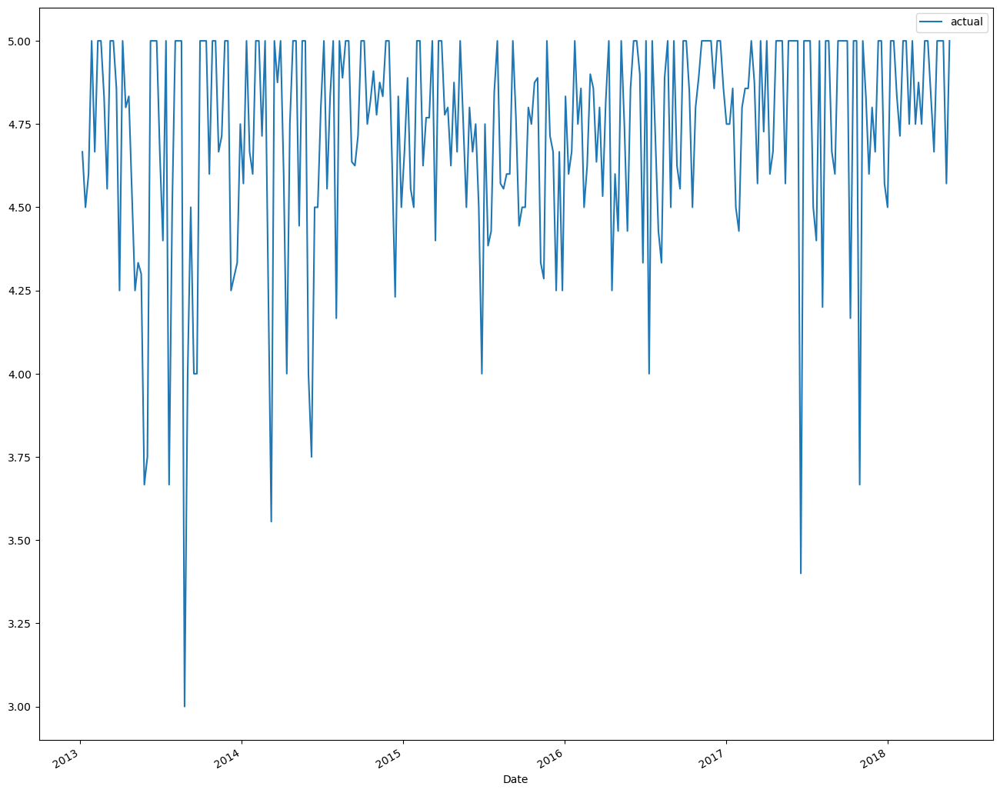

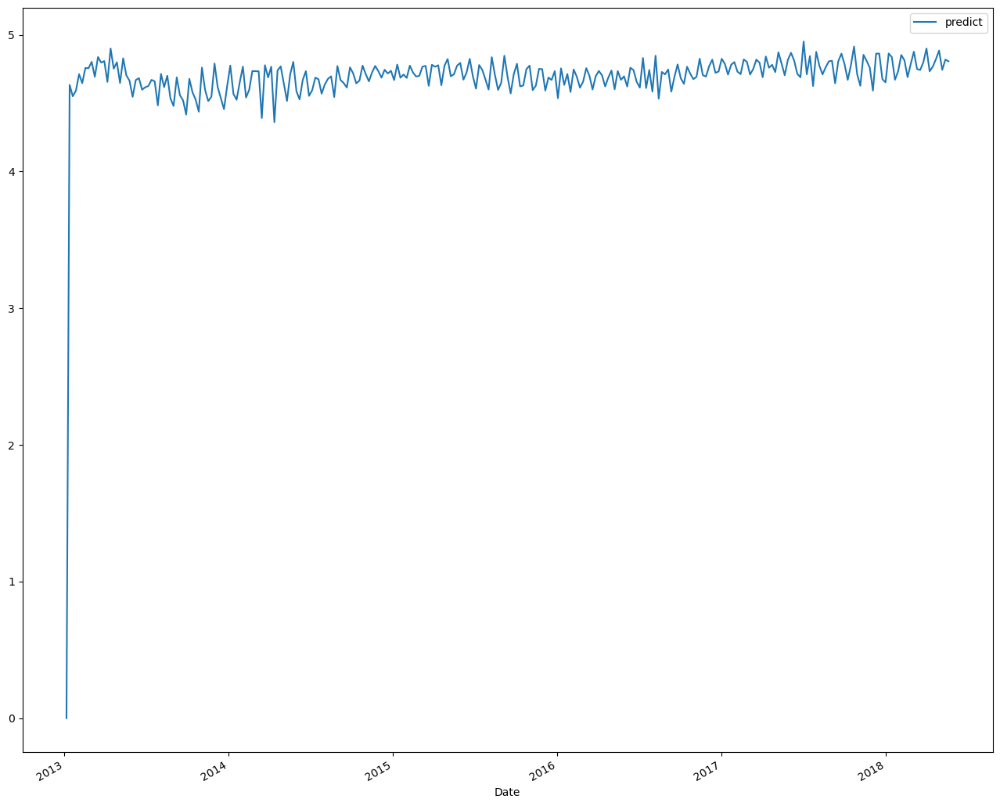

In [487]:
# plot the actual and forecast data of the test data
l1_sarima.plot()
l2_sarima.plot()

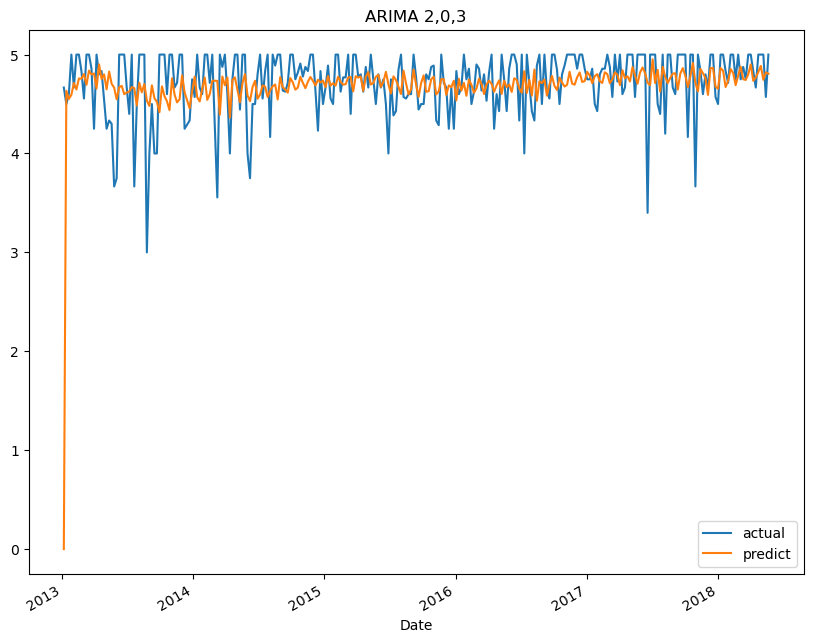

In [490]:
dfres1.actual.plot(figsize=(10,8),legend=True)
dfres1.predict.plot(legend=True)
plt.title('ARIMA 2,0,3')
plt.show()

In [491]:
l2_sarima.tail()

,predict
Date,
2018-04-22,4.822973
2018-04-29,4.885770
2018-05-06,4.744916
2018-05-13,4.819729
2018-05-20,4.807260


## Forecasting values

In [501]:

import datetime
import pandas as pd
 
# initializing date
test_date = datetime.datetime.strptime("06-20-2018", "%m-%d-%Y")
 
# initializing K
K = 30
 
date_generated = pd.date_range(test_date, periods=K,freq='W')
print(date_generated.strftime("%d-%m-%Y"))

Index(['24-06-2018', '01-07-2018', '08-07-2018', '15-07-2018', '22-07-2018',
       '29-07-2018', '05-08-2018', '12-08-2018', '19-08-2018', '26-08-2018',
       '02-09-2018', '09-09-2018', '16-09-2018', '23-09-2018', '30-09-2018',
       '07-10-2018', '14-10-2018', '21-10-2018', '28-10-2018', '04-11-2018',
       '11-11-2018', '18-11-2018', '25-11-2018', '02-12-2018', '09-12-2018',
       '16-12-2018', '23-12-2018', '30-12-2018', '06-01-2019', '13-01-2019'],
      dtype='object')


In [502]:
date_generated

DatetimeIndex(['2018-06-24', '2018-07-01', '2018-07-08', '2018-07-15',
               '2018-07-22', '2018-07-29', '2018-08-05', '2018-08-12',
               '2018-08-19', '2018-08-26', '2018-09-02', '2018-09-09',
               '2018-09-16', '2018-09-23', '2018-09-30', '2018-10-07',
               '2018-10-14', '2018-10-21', '2018-10-28', '2018-11-04',
               '2018-11-11', '2018-11-18', '2018-11-25', '2018-12-02',
               '2018-12-09', '2018-12-16', '2018-12-23', '2018-12-30',
               '2019-01-06', '2019-01-13'],
              dtype='datetime64[ns]', freq='W-SUN')

In [503]:
forecast_sarima=pd.DataFrame()
forecast_sarima['Date']=date_generated
forecast_sarima.dtypes

Date    datetime64[ns]
dtype: object

In [504]:
forecast_sarima['Date']=pd.to_datetime(forecast_sarima['Date'])

In [505]:
forecast_sarima.set_index('Date',inplace=True)

In [506]:
v=[]
for i in model1.forecast(30):
    v.append(i)

In [507]:
forecast_sarima['Forecasted values1']=v

In [508]:
forecast_sarima

,Forecasted values1
Date,
2018-06-24,4.883378
2018-07-01,4.740358
2018-07-08,4.849580
2018-07-15,4.815367
2018-07-22,4.841277
2018-07-29,4.780233
2018-08-05,4.829953
2018-08-12,4.834072
2018-08-19,4.817084


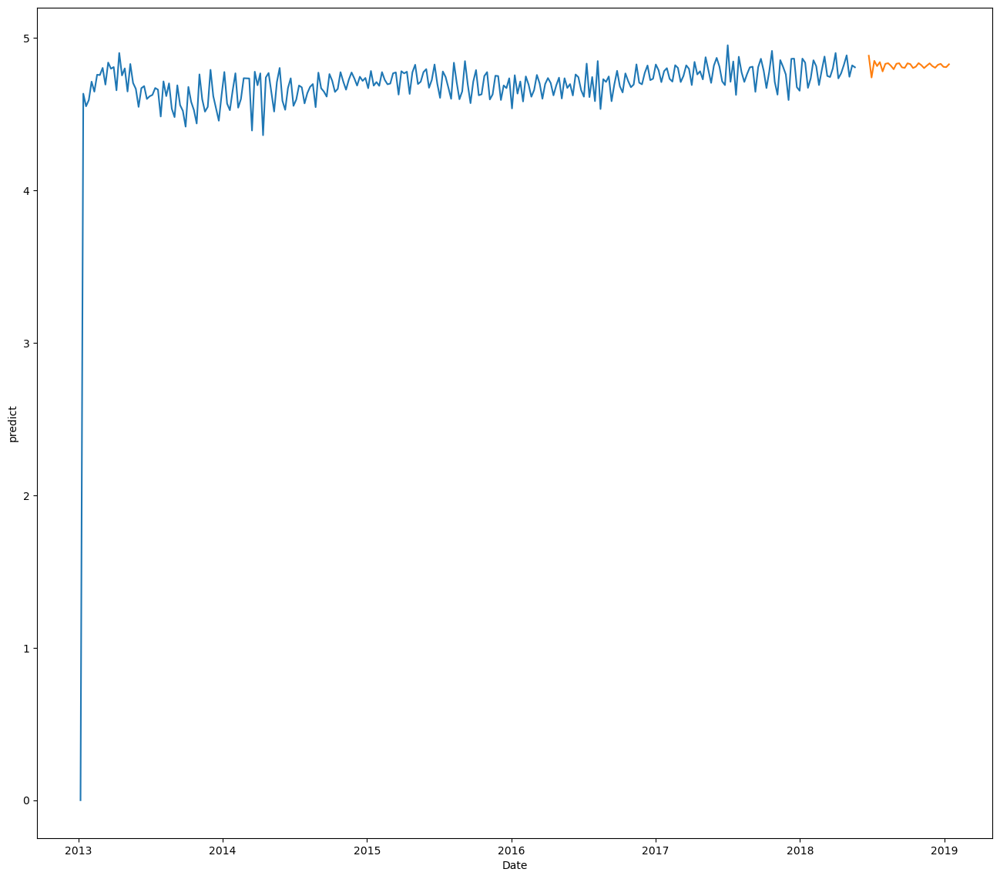

In [509]:
sns.lineplot(y=l2_sarima.predict,x=l2_sarima.index)
sns.lineplot(y=forecast_sarima['Forecasted values1'],x=forecast_sarima.index);

### Considering AIC and RMSE values, we can go by ARIMA model

### NOW LET'S PLOT FOR A NEGATIVE SENTIMENT PRODUCT

In [512]:
df_negative.groupby(by='brand')['textblob_sentiment'].count().sort_values(ascending= False ).head()

brand
JIM DUNLOP               368
D'Addario Accessories    335
Fender                   314
D'Addario                286
Behringer                274
Name: textblob_sentiment, dtype: int64

### We can see JIM DUNLOP has recevied the most negative reviews

In [514]:
df_negative.brand.value_counts()

JIM DUNLOP                                      368
D'Addario Accessories                           335
Fender                                          314
D'Addario                                       286
Behringer                                       274
OnStage                                         241
Pyle                                            149
Ernie Ball                                      135
Kmise                                            96
Neewer                                           93
ChromaCast                                       87
Yamaha                                           85
Donner                                           84
Elixir                                           84
Hosa                                             70
JOYO                                             65
Musiclily                                        63
Snark                                            63
Korg                                             61
Shure       

In [521]:
df_negative[df_negative['product_id'].duplicated()]

,ratings,verified,reviewTime,reviewerID,reviewerName,brand,title,product_id,price,month,year,reviews,cleaned_reviews,token_nltk,stem_reviews,polarity,textblob_sentiment
Date,,,,,,,,,,,,,,,,,
2014-09-19,2.0,True,2014-09-19,A11FWGZDJHCKAY,Lynn,ChordBuddy,ChordBuddy Guitar Learning System for Right Ha...,1480360295,6.04000,9,2014,Guitar Playing I found this product very clums...,guitar playing found product clumsy im sorry d...,"[guitar, playing, found, product, clumsy, im, ...",guitar play found product clumsi im sorri didn...,-0.400000,negative
2014-04-29,5.0,True,2014-04-29,A2UBH2SVH6PO2Z,Nanc,ChordBuddy,ChordBuddy Guitar Learning System for Right Ha...,1480360295,6.04000,4,2014,Hard to work Did not fit on guitar as well as ...,hard work not fit guitar seen tv still trying ...,"[hard, work, not, fit, guitar, seen, tv, still...",hard work not fit guitar seen tv still tri fig...,-0.194792,negative
2013-02-13,4.0,True,2013-02-13,A1OCUKI8ZBUVX3,SEABEE,ChordBuddy,ChordBuddy Guitar Learning System for Right Ha...,1480360295,6.04000,2,2013,chordbuddy It did what it was suppose to. Hard...,chordbuddy suppose hard keepit tuned like reco...,"[chordbuddy, suppose, hard, keepit, tuned, lik...",chordbuddi suppos hard keepit tune like recomm...,-0.291667,negative
2015-12-07,5.0,True,2015-12-07,A1C9T7N94AG5NR,Maurice Alban,Monster,Monster Standard 100-21' Instrument Cable - St...,B00004Y2UT,18.53982,12,2015,Five Stars Never fails me,five stars fails,"[five, stars, fails]",five star fail,-0.500000,negative
2016-12-15,3.0,True,2016-12-15,A1HFYEZ8WXEMK7,wayne,Yamaha,Yamaha FC5 Compact Sustain Pedal for Portable ...,B00005ML71,14.35000,12,2016,Three Stars I returned this item and it won't ...,stars returned item wont work yamaha keyboard ...,"[stars, returned, item, wont, work, yamaha, ke...",star return item wont work yamaha keyboard wro...,-0.500000,negative
2016-07-25,5.0,True,2016-07-25,A2BBO0OFCBODG9,Kim L.,Yamaha,Yamaha FC5 Compact Sustain Pedal for Portable ...,B00005ML71,14.35000,7,2016,Works well with my Yamaha p115. I can get ... ...,works yamaha works yamaha subtle variations da...,"[works, yamaha, works, yamaha, subtle, variati...",work yamaha work yamaha subtl variat dampen co...,-0.333333,negative
2016-02-12,5.0,True,2016-02-12,A2USZZ4Z0U6P1S,Raymond Marco,Yamaha,Yamaha FC5 Compact Sustain Pedal for Portable ...,B00005ML71,14.35000,2,2016,What a difference from the silly little foot s...,difference silly little foot switch comes pian...,"[difference, silly, little, foot, switch, come...",differ silli littl foot switch come piano diff...,-0.343750,negative
2016-01-08,5.0,True,2016-01-08,AABOUTBKK5GP0,Hunter R,Yamaha,Yamaha FC5 Compact Sustain Pedal for Portable ...,B00005ML71,14.35000,1,2016,Heavy Duty! Heavy duty!,heavy duty heavy duty,"[heavy, duty, heavy, duty]",heavi duti heavi duti,-0.200000,negative
2013-11-17,3.0,True,2013-11-17,A2NIT6BKW11XJQ,Jai,Yamaha,Yamaha FC5 Compact Sustain Pedal for Portable ...,B00005ML71,14.35000,11,2013,HAS TO GET USE TO THE SIZE If you are not use ...,use size not use large sustaining pedal playin...,"[use, size, not, use, large, sustaining, pedal...",use size not use larg sustain pedal play piano...,-0.191071,negative


In [525]:
df_negative['product_id'].drop_duplicates(inplace=True,keep='first')

In [528]:
df_neg=df_negative[df_negative['product_id'].duplicated()]

In [530]:
df_neg.brand.value_counts()

D'Addario Accessories                267
JIM DUNLOP                           253
D'Addario                            249
Behringer                            169
Fender                               168
OnStage                              152
Pyle                                  96
Ernie Ball                            85
Elixir                                72
Neewer                                59
Snark                                 54
ChromaCast                            54
Donner                                52
JOYO                                  50
Kmise                                 43
Hosa                                  42
Kyser                                 42
Yamaha                                33
Korg                                  31
DragonPad USA                         27
Evans                                 24
Nady                                  24
Musiclily                             22
Gator                                 22
DigiTech        

In [653]:
df_neg.groupby(by='brand')['ratings'].count().sort_values(ascending= False )

brand
D'Addario Accessories                267
JIM DUNLOP                           253
D'Addario                            249
Behringer                            169
Fender                               168
OnStage                              152
Pyle                                  96
Ernie Ball                            85
Elixir                                72
Neewer                                59
Snark                                 54
ChromaCast                            54
Donner                                52
JOYO                                  50
Kmise                                 43
Kyser                                 42
Hosa                                  42
Yamaha                                33
Korg                                  31
DragonPad USA                         27
Evans                                 24
Nady                                  24
Musiclily                             22
Gator                                 22
DigiTech  

In [598]:
# doing time series on product B00NPZI1ZS
time1=df_time[(df_time['brand']=="Fender")]
time1.shape

(10091, 17)

In [600]:
df1=time1[['ratings']]
df1.head()

,ratings
Date,
2012-03-16,4.0
2013-09-20,2.0
2013-08-13,4.0
2013-08-07,5.0
2013-07-09,5.0


### Weekly resample

In [601]:
df1_year=df1.resample('W').mean()

In [602]:
df1_year.isnull().sum()

ratings    200
dtype: int64

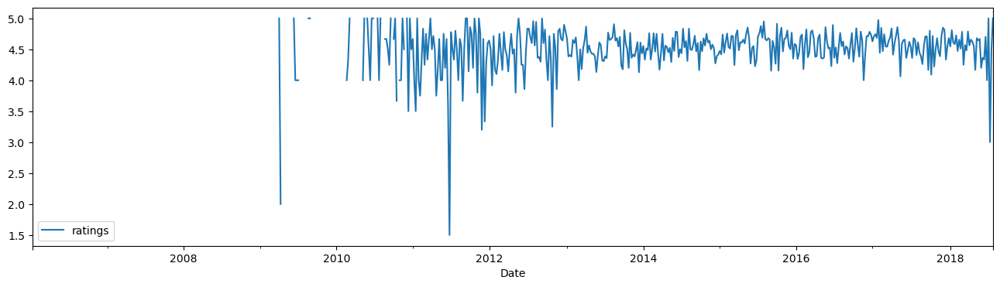

In [603]:
df1_year.plot()
plt.show()

In [604]:
df1_year

,ratings
Date,
2006-01-15,3.000000
2006-01-22,NaN
2006-01-29,NaN
2006-02-05,NaN
2006-02-12,NaN
2006-02-19,NaN
2006-02-26,NaN
2006-03-05,NaN
2006-03-12,NaN


In [605]:
df1_year=df1_year[df1_year.index>'2012-01-01']

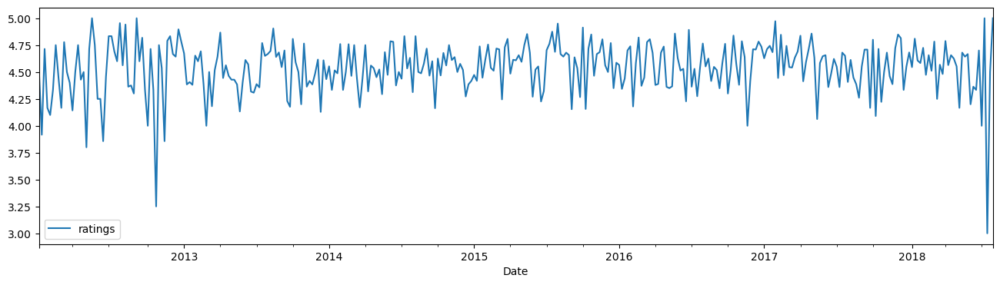

In [606]:
df1_year.plot()
plt.show()

In [607]:
df1_year.tail()

,ratings
Date,
2018-07-01,4.0
2018-07-08,5.0
2018-07-15,3.0
2018-07-22,4.5
2018-07-29,5.0


In [608]:
df1_year.dropna(inplace=True)

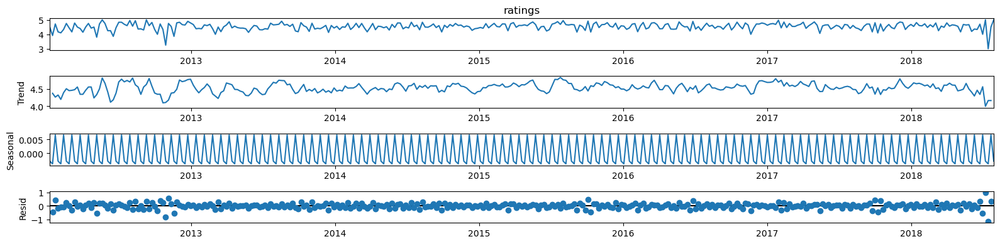

In [609]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 16, 4
decomposition = sm.tsa.seasonal_decompose(df1_year.ratings,model='additive',period=3) # additive seasonal index
fig = decomposition.plot()
plt.show()

### No trend but seasonality is present

In [610]:
checkStationarity(df1_year)

'p-value=0.0. Data is stationary'

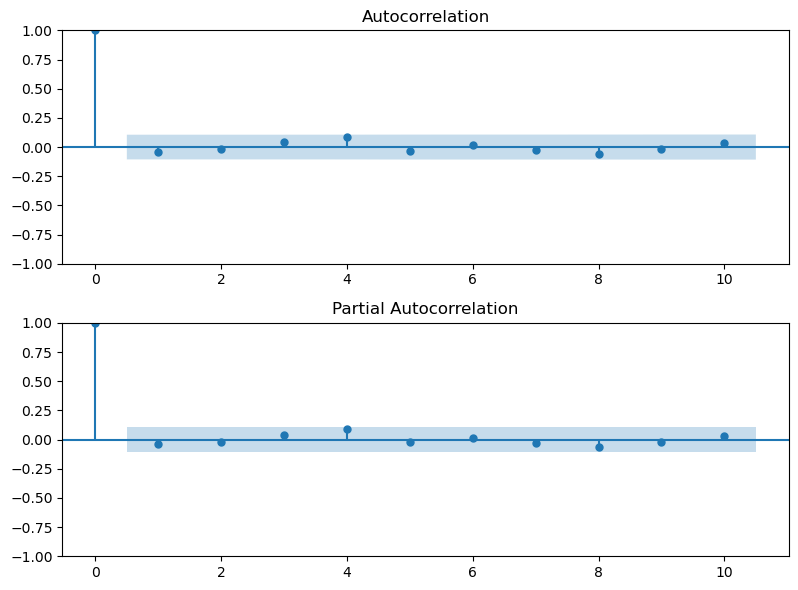

In [612]:
#draw Acf and Pacf plot
fig = plt.figure(figsize=(8, 6))

# Show ACF
ax1 = fig.add_subplot(211)
sm.graphics.tsa.plot_acf(df1_year, lags=10,ax=ax1)

# Show PACF
ax2 = fig.add_subplot(212)
sm.graphics.tsa.plot_pacf(df1_year, lags=10, ax=ax2)

plt.tight_layout()

In [613]:
d=0; #ARMA 
lis=[]
for p in [1,2,3,4,5]:
    for q in [1,2,3,4,5]:
        lis.append((p,d,q))

# building model
model=[]
for i in lis:
    m = ARIMA(df1_year, order=i).fit() # d=0 becomes ARMA
    model.append(m)

# checking model is good or not
c=1
for i in model:
    pvalue = sm.stats.acorr_ljungbox(i.resid, lags=[1], return_df=True)['lb_pvalue'].values
    if pvalue < 0.05:
        print(f'Model {c} Not a good model')
    else:
        print(f'Model {c} Good model')
    c+=1

Model 1 Good model
Model 2 Good model
Model 3 Good model
Model 4 Good model
Model 5 Good model
Model 6 Good model
Model 7 Good model
Model 8 Good model
Model 9 Good model
Model 10 Good model
Model 11 Good model
Model 12 Good model
Model 13 Good model
Model 14 Good model
Model 15 Good model
Model 16 Good model
Model 17 Good model
Model 18 Good model
Model 19 Good model
Model 20 Good model
Model 21 Good model
Model 22 Good model
Model 23 Good model
Model 24 Good model
Model 25 Good model


In [614]:
# Arma
# calculating AIC and BIC score   
aic=[]
bic=[]
for i in model[0:]:
    aic.append(i.aic)
    bic.append(i.bic)

# predicting values
forecast=[]
for i in model[0:]:
    fcast = i.predict(start=0, end=len(df1_year)-1)
    forecast.append(fcast)

# calculating MSE and RMSE score
MSE = []
RMSE = []
for i in forecast:
    mse = mean_squared_error(df1_year, i)
    rmse = np.sqrt(mse)
    MSE.append(mse)
    RMSE.append(rmse)

# printing model numbers
model_no=[]
for i in range(0,len(model)):
    model_no.append('Model '+str(i))
    
# dataframe of all results
df_results = pd.DataFrame({'Model No.': model_no, '(p, d, q)':lis[0:], 'AIC': aic, 'BIC': bic, 'MSE': MSE, 'RMSE': RMSE})
df_results

,Model No.,"(p, d, q)",AIC,BIC,MSE,RMSE
0,Model 0,"(1, 0, 1)",9.344073,24.694995,0.058779,0.242445
1,Model 1,"(1, 0, 2)",11.255887,30.444539,0.058765,0.242414
2,Model 2,"(1, 0, 3)",11.176431,34.202813,0.058415,0.241692
3,Model 3,"(1, 0, 4)",10.713386,37.577499,0.058008,0.240848
4,Model 4,"(1, 0, 5)",12.486619,43.188463,0.057972,0.240773
5,Model 5,"(2, 0, 1)",11.205946,30.394598,0.058756,0.242397
6,Model 6,"(2, 0, 2)",11.792683,34.819066,0.058520,0.241908
7,Model 7,"(2, 0, 3)",7.186485,34.050598,0.057441,0.239669
8,Model 8,"(2, 0, 4)",12.679110,43.380954,0.058002,0.240837
9,Model 9,"(2, 0, 5)",13.161068,47.700642,0.057752,0.240317


In [615]:
print('Taking model with lowest RMSE score:')
df_results[df_results.RMSE==df_results.RMSE.min()]

Taking model with lowest RMSE score:


,Model No.,"(p, d, q)",AIC,BIC,MSE,RMSE
23,Model 23,"(5, 0, 4)",10.577118,52.792153,0.056775,0.238275


In [616]:
print('Taking model with lowest AIC score:')
df_results[df_results.AIC==df_results.AIC.min()]

Taking model with lowest AIC score:


,Model No.,"(p, d, q)",AIC,BIC,MSE,RMSE
11,Model 11,"(3, 0, 2)",7.184019,34.048133,0.057441,0.239668


In [633]:
model1 = ARIMA(df1_year,order=(5,d,4)).fit()
f1 = model1.predict(start=0,end=len(df1_year)-1)
f1

Date
2012-01-08    4.536810
2012-01-15    4.538240
2012-01-22    4.559225
2012-01-29    4.511734
2012-02-05    4.540759
2012-02-12    4.529480
2012-02-19    4.551037
2012-02-26    4.500261
2012-03-04    4.567130
2012-03-11    4.564515
2012-03-18    4.538483
2012-03-25    4.547911
2012-04-01    4.517852
2012-04-08    4.561839
2012-04-15    4.486948
2012-04-22    4.525217
2012-04-29    4.532017
2012-05-06    4.557758
2012-05-13    4.608067
2012-05-20    4.505330
2012-05-27    4.532025
2012-06-03    4.478852
2012-06-10    4.583586
2012-06-17    4.542972
2012-06-24    4.559020
2012-07-01    4.533330
2012-07-08    4.465710
2012-07-15    4.530708
2012-07-22    4.539699
2012-07-29    4.583249
2012-08-05    4.575950
2012-08-12    4.550441
2012-08-19    4.539574
2012-08-26    4.512320
2012-09-02    4.503039
2012-09-09    4.524707
2012-09-16    4.459695
2012-09-23    4.576182
2012-09-30    4.541402
2012-10-07    4.633305
2012-10-14    4.586738
2012-10-21    4.516616
2012-10-28    4.494382
2012-1

In [634]:
dfres=pd.DataFrame({'actual':df1_year.ratings, 'predict':f1.values})
dfres['error'] = dfres.actual - dfres.predict
dfres

,actual,predict,error
Date,,,
2012-01-08,4.500000,4.536810,-0.036810
2012-01-15,3.916667,4.538240,-0.621573
2012-01-22,4.714286,4.559225,0.155060
2012-01-29,4.166667,4.511734,-0.345067
2012-02-05,4.100000,4.540759,-0.440759
2012-02-12,4.333333,4.529480,-0.196146
2012-02-19,4.750000,4.551037,0.198963
2012-02-26,4.444444,4.500261,-0.055817
2012-03-04,4.166667,4.567130,-0.400463


In [635]:
l1=dfres[['actual']]
l2=dfres[['predict']]

<AxesSubplot:xlabel='Date'>

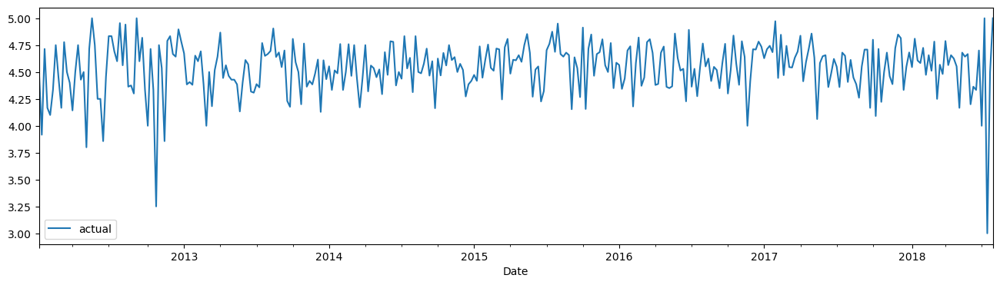

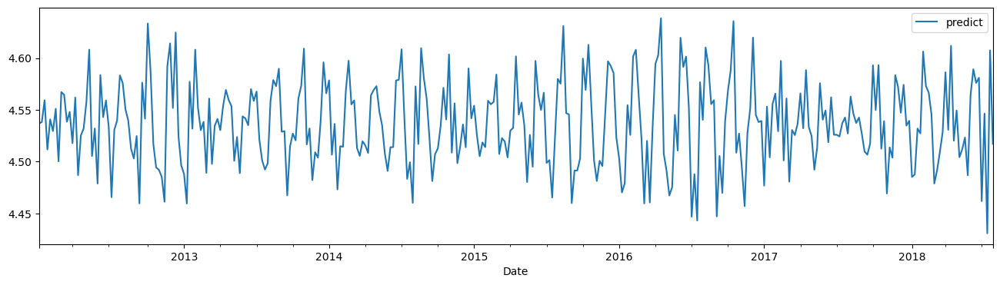

In [636]:
# plot the actual and forecast data of the test data
l1.plot()
l2.plot()

In [637]:
l2.tail()

,predict
Date,
2018-07-01,4.461956
2018-07-08,4.546376
2018-07-15,4.430844
2018-07-22,4.607399
2018-07-29,4.517109


## Forecasting values

In [638]:

import datetime
import pandas as pd
 
# initializing date
test_date = datetime.datetime.strptime("08-6-2018", "%m-%d-%Y")
 
# initializing K
K = 30
 
date_generated = pd.date_range(test_date, periods=K,freq='W')
print(date_generated.strftime("%d-%m-%Y"))

Index(['12-08-2018', '19-08-2018', '26-08-2018', '02-09-2018', '09-09-2018',
       '16-09-2018', '23-09-2018', '30-09-2018', '07-10-2018', '14-10-2018',
       '21-10-2018', '28-10-2018', '04-11-2018', '11-11-2018', '18-11-2018',
       '25-11-2018', '02-12-2018', '09-12-2018', '16-12-2018', '23-12-2018',
       '30-12-2018', '06-01-2019', '13-01-2019', '20-01-2019', '27-01-2019',
       '03-02-2019', '10-02-2019', '17-02-2019', '24-02-2019', '03-03-2019'],
      dtype='object')


In [639]:
date_generated

DatetimeIndex(['2018-08-12', '2018-08-19', '2018-08-26', '2018-09-02',
               '2018-09-09', '2018-09-16', '2018-09-23', '2018-09-30',
               '2018-10-07', '2018-10-14', '2018-10-21', '2018-10-28',
               '2018-11-04', '2018-11-11', '2018-11-18', '2018-11-25',
               '2018-12-02', '2018-12-09', '2018-12-16', '2018-12-23',
               '2018-12-30', '2019-01-06', '2019-01-13', '2019-01-20',
               '2019-01-27', '2019-02-03', '2019-02-10', '2019-02-17',
               '2019-02-24', '2019-03-03'],
              dtype='datetime64[ns]', freq='W-SUN')

In [640]:
forecast_arima=pd.DataFrame()
forecast_arima['Date']=date_generated
forecast_arima.dtypes

Date    datetime64[ns]
dtype: object

In [641]:
forecast_arima['Date']=pd.to_datetime(forecast_arima['Date'])

In [642]:
forecast_arima.set_index('Date',inplace=True)

In [643]:
v=[]
for i in model1.forecast(30):
    v.append(i)

In [644]:
forecast_arima['Forecasted values1']=v

In [645]:
forecast_arima

,Forecasted values1
Date,
2018-08-12,4.522134
2018-08-19,4.512934
2018-08-26,4.609817
2018-09-02,4.549591
2018-09-09,4.559619
2018-09-16,4.547170
2018-09-23,4.479450
2018-09-30,4.536871
2018-10-07,4.481500


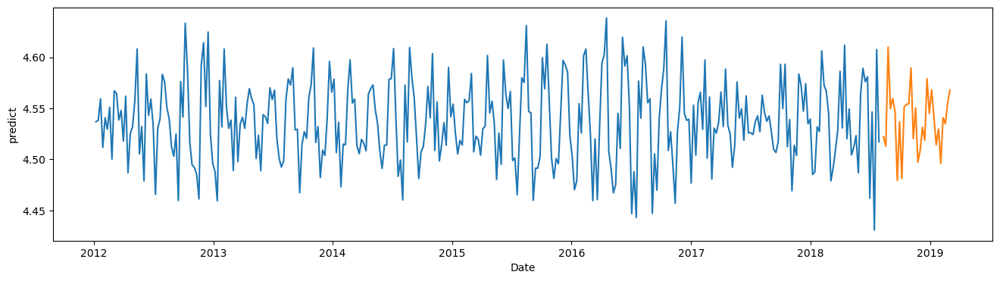

In [646]:
sns.lineplot(y=l2.predict,x=l2.index)
sns.lineplot(y=forecast_arima['Forecasted values1'],x=forecast_arima.index);

### NOW SARIMA

In [647]:
# for seasonal data, use the SARIMAX. start with initial values for p,d,q
p=0; q=0; d=0
P=0;Q=0;D=0 #( there is 1 repation occurs in acf and pcf graph thats why i have taken the P=1,Q=1 )
sarima_model1 = sm.tsa.statespace.SARIMAX(df1_year,order=(p,d,q),seasonal_order=(P,D,Q,12)).fit()

In [648]:
d=0; #ARMA 
lis=[]
for p in [1,2,3,4,5]:
    for q in [1,2,3,4,5]:
        lis.append((p,d,q))

# building model
model=[]
for i in lis:
    m = SARIMAX(df1_year, order=i).fit() # d=0 becomes ARMA
    model.append(m)

# checking model is good or not
c=1
for i in model:
    pvalue = sm.stats.acorr_ljungbox(i.resid, lags=[1], return_df=True)['lb_pvalue'].values
    if pvalue < 0.05:
        print(f'Model {c} Not a good model')
    else:
        print(f'Model {c} Good model')
    c+=1

Model 1 Good model
Model 2 Good model
Model 3 Good model
Model 4 Good model
Model 5 Good model
Model 6 Good model
Model 7 Good model
Model 8 Good model
Model 9 Good model
Model 10 Good model
Model 11 Good model
Model 12 Good model
Model 13 Good model
Model 14 Good model
Model 15 Good model
Model 16 Good model
Model 17 Good model
Model 18 Good model
Model 19 Good model
Model 20 Good model
Model 21 Good model
Model 22 Good model
Model 23 Good model
Model 24 Good model
Model 25 Good model


In [649]:
# Arma
# calculating AIC and BIC score   
aic=[]
bic=[]
for i in model[0:]:
    aic.append(i.aic)
    bic.append(i.bic)

# predicting values
forecast=[]
for i in model[0:]:
    fcast = i.predict(start=0, end=len(df1_year)-1)
    forecast.append(fcast)

# calculating MSE and RMSE score
MSE = []
RMSE = []
for i in forecast:
    mse = mean_squared_error(df1_year, i)
    rmse = np.sqrt(mse)
    MSE.append(mse)
    RMSE.append(rmse)

# printing model numbers
model_no=[]
for i in range(0,len(model)):
    model_no.append('Model '+str(i))
    
# dataframe of all results
df_results = pd.DataFrame({'Model No.': model_no, '(p, d, q)':lis[0:], 'AIC': aic, 'BIC': bic, 'MSE': MSE, 'RMSE': RMSE})
df_results

,Model No.,"(p, d, q)",AIC,BIC,MSE,RMSE
0,Model 0,"(1, 0, 1)",18.680544,30.193735,0.119277,0.345365
1,Model 1,"(1, 0, 2)",19.708490,35.059412,0.119103,0.345114
2,Model 2,"(1, 0, 3)",21.502367,40.691019,0.119073,0.345070
3,Model 3,"(1, 0, 4)",22.935351,45.961734,0.118990,0.344949
4,Model 4,"(1, 0, 5)",22.397987,49.262100,0.118561,0.344326
5,Model 5,"(2, 0, 1)",19.752703,35.103625,0.119113,0.345128
6,Model 6,"(2, 0, 2)",27.584777,46.773430,0.119612,0.345850
7,Model 7,"(2, 0, 3)",23.324454,46.350837,0.119047,0.345032
8,Model 8,"(2, 0, 4)",25.624655,52.488768,0.119094,0.345100
9,Model 9,"(2, 0, 5)",25.713944,56.415787,0.118780,0.344644


In [650]:
print('Taking model with lowest RMSE score:')
df_results[df_results.RMSE==df_results.RMSE.min()]

Taking model with lowest RMSE score:


,Model No.,"(p, d, q)",AIC,BIC,MSE,RMSE
24,Model 24,"(5, 0, 5)",26.506674,68.721708,0.118003,0.343516


In [651]:
print('Taking model with lowest AIC score:')
df_results[df_results.AIC==df_results.AIC.min()]

Taking model with lowest AIC score:


,Model No.,"(p, d, q)",AIC,BIC,MSE,RMSE
0,Model 0,"(1, 0, 1)",18.680544,30.193735,0.119277,0.345365


### We can see both rmse and aic values are lesser in ARIMA model, hence we do notproceed ahead

In [483]:
model1 = SARIMAX(df1_year,order=(5,d,4)).fit()
f1 = model1.predict(start=0,end=len(df1_year)-1)
f1

Date
2013-01-06    0.000000
2013-01-13    4.634151
2013-01-20    4.551538
2013-01-27    4.592658
2013-02-03    4.713163
2013-02-10    4.647398
2013-02-17    4.758414
2013-02-24    4.756461
2013-03-03    4.803274
2013-03-10    4.693890
2013-03-17    4.838344
2013-03-24    4.798150
2013-03-31    4.808788
2013-04-07    4.656426
2013-04-14    4.901123
2013-04-21    4.753791
2013-04-28    4.800039
2013-05-05    4.648532
2013-05-12    4.828918
2013-05-19    4.704525
2013-05-26    4.665612
2013-06-02    4.547558
2013-06-09    4.670456
2013-06-16    4.683837
2013-06-23    4.599637
2013-06-30    4.617148
2013-07-07    4.626192
2013-07-14    4.671332
2013-07-21    4.660505
2013-07-28    4.484538
2013-08-04    4.714831
2013-08-11    4.618255
2013-08-18    4.701762
2013-08-25    4.535375
2013-09-01    4.480496
2013-09-08    4.689057
2013-09-15    4.559601
2013-09-22    4.521592
2013-09-29    4.417970
2013-10-06    4.678583
2013-10-13    4.580758
2013-10-20    4.526622
2013-10-27    4.438624
2013-1

In [668]:
df_final.head()

,ratings,verified,reviewTime,reviewerID,reviewerName,brand,title,product_id,price,month,year,reviews,cleaned_reviews,token_nltk,stem_reviews,polarity,textblob_sentiment
0,5.0,True,2016-10-30,A3FO5AKVTFRCRJ,francisco,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,10,2016,Five Stars It's good for beginners,five stars good beginners,"[five, stars, good, beginners]",five star good beginn,0.700000,positive
1,5.0,True,2016-06-30,A3UCGC1DHFMBCE,Eb Jack Murray,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,6,2016,Five Stars I recommend this starter Ukulele ki...,five stars recommend starter ukulele kit youne...,"[five, stars, recommend, starter, ukulele, kit...",five star recommend starter ukulel kit youne l...,0.000000,neutral
2,5.0,True,2016-05-09,A2S9SLRYLPGYZB,Clara LaMarr,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,5,2016,Learning new songs to play regularly G'daughte...,learning new songs play regularly gdaughter re...,"[learning, new, songs, play, regularly, gdaugh...",learn new song play regular gdaughter receiv c...,0.045455,neutral
3,4.0,True,2016-04-10,A15RTJWPG8OKOE,Eagle80,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,4,2016,A bargain-bin good-enough ukulele that's held ...,bargainbin goodenough ukulele thats held years...,"[bargainbin, goodenough, ukulele, thats, held,...",bargainbin goodenough ukulel that held year st...,0.244619,positive
4,1.0,True,2016-02-06,A12ET1WO3OAVU7,Amazon Customer,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,2,2016,Poor Quality product. Please pay attention bet...,poor quality product pay attention better revi...,"[poor, quality, product, pay, attention, bette...",poor qualiti product pay attent better review ...,0.144643,positive


In [669]:
df_csv=df_final.copy()

In [670]:
df_final.columns

Index(['ratings', 'verified', 'reviewTime', 'reviewerID', 'reviewerName',
       'brand', 'title', 'product_id', 'price', 'month', 'year', 'reviews',
       'cleaned_reviews', 'token_nltk', 'stem_reviews', 'polarity',
       'textblob_sentiment'],
      dtype='object')

In [672]:
df_csv.drop(columns=['cleaned_reviews','token_nltk', 'stem_reviews', 'polarity'],inplace=True)

In [673]:
df_csv.head()

,ratings,verified,reviewTime,reviewerID,reviewerName,brand,title,product_id,price,month,year,reviews,textblob_sentiment
0,5.0,True,2016-10-30,A3FO5AKVTFRCRJ,francisco,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,10,2016,Five Stars It's good for beginners,positive
1,5.0,True,2016-06-30,A3UCGC1DHFMBCE,Eb Jack Murray,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,6,2016,Five Stars I recommend this starter Ukulele ki...,neutral
2,5.0,True,2016-05-09,A2S9SLRYLPGYZB,Clara LaMarr,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,5,2016,Learning new songs to play regularly G'daughte...,neutral
3,4.0,True,2016-04-10,A15RTJWPG8OKOE,Eagle80,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,4,2016,A bargain-bin good-enough ukulele that's held ...,positive
4,1.0,True,2016-02-06,A12ET1WO3OAVU7,Amazon Customer,Alfred Music Publishing,"Alfreds Teach Yourself to Play Ukulele, Comple...",0739079891,18.53982,2,2016,Poor Quality product. Please pay attention bet...,positive


In [674]:
df_csv.to_csv('Musical_Instruments_tableau.csv',index=False)

In [676]:
df_final.reviews.nunique()

187334

In [677]:
df_final.product_id.nunique()

10301